<a href="https://colab.research.google.com/github/Sriganesaniyer/Dynamic-visualization-and-statistical-interpretation-of-oceanographic-data/blob/main/Exploratory_data_analysis_on_Auto_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Exploratory data analysis on Auto dataset

In [ ]:
# Dataset = Auto.csv

# Loading dataset

import pandas as pd
df = pd.read_csv('Auto.csv')
print(df.head())

    mpg  cylinders  displacement  horsepower  weight  acceleration  year  \
0  18.0          8         307.0         130    3504          12.0    70   
1  15.0          8         350.0         165    3693          11.5    70   
2  18.0          8         318.0         150    3436          11.0    70   
3  16.0          8         304.0         150    3433          12.0    70   
4  17.0          8         302.0         140    3449          10.5    70   

   origin                       name  
0       1  chevrolet chevelle malibu  
1       1          buick skylark 320  
2       1         plymouth satellite  
3       1              amc rebel sst  
4       1                ford torino  


In [ ]:
# Identifying data types of attributes (Qualitative or Quantitative)

import pandas as pd
import numpy as np
df = pd.read_csv('Auto.csv')
def get_data_type(series, col_name):
    if series.dtype == object:
        return "Qualitative (Categorical) - Nominal"
    elif np.issubdtype(series.dtype, np.number):
        unique_vals = series.unique()
        n_unique = series.nunique()
        if col_name.lower() in ['year', 'grade', 'rank']:
            return "Qualitative (Categorical) - Ordinal"
        if np.issubdtype(series.dtype, np.integer):
            if n_unique <= 15:  # Assuming if there are less than 15 unique values, attribute is of discrete data type
                return "Quantitative (Numerical) - Discrete"
            else:
                return "Quantitative (Numerical) - Continuous - Ratio"
        elif np.issubdtype(series.dtype, np.floating):
            return "Quantitative (Numerical) - Continuous - Ratio"
    return "Unknown"
for col in df.columns:
    dtype = get_data_type(df[col], col)
    print(f"{col}: {dtype}")

mpg: Quantitative (Numerical) - Continuous - Ratio
cylinders: Quantitative (Numerical) - Discrete
displacement: Quantitative (Numerical) - Continuous - Ratio
horsepower: Quantitative (Numerical) - Continuous - Ratio
weight: Quantitative (Numerical) - Continuous - Ratio
acceleration: Quantitative (Numerical) - Continuous - Ratio
year: Qualitative (Categorical) - Ordinal
origin: Quantitative (Numerical) - Discrete
name: Qualitative (Categorical) - Nominal


In [ ]:
# Identifying the data types of the attributes

import pandas as pd
df = pd.read_csv('Auto.csv')
for col in df.columns:
    print(f"{col}: {df[col].dtype}")


mpg: float64
cylinders: int64
displacement: float64
horsepower: int64
weight: int64
acceleration: float64
year: int64
origin: int64
name: object


In [ ]:
# Summary of dataset (Dimension, Columns, Datatypes, Missing value count)

import pandas as pd
df = pd.read_csv('Auto.csv')
print("Summary")
print(f"Shape (rows, columns): {df.shape}")
print(f"Columns:\n{df.columns.tolist()}")
print("\nData types:")
print(df.dtypes)
print("\nFirst 5 rows:")
print(df.head())


Summary
Shape (rows, columns): (392, 9)
Columns:
['mpg', 'cylinders', 'displacement', 'horsepower', 'weight', 'acceleration', 'year', 'origin', 'name']

Data types:
mpg             float64
cylinders         int64
displacement    float64
horsepower        int64
weight            int64
acceleration    float64
year              int64
origin            int64
name             object
dtype: object

First 5 rows:
    mpg  cylinders  displacement  horsepower  weight  acceleration  year  \
0  18.0          8         307.0         130    3504          12.0    70   
1  15.0          8         350.0         165    3693          11.5    70   
2  18.0          8         318.0         150    3436          11.0    70   
3  16.0          8         304.0         150    3433          12.0    70   
4  17.0          8         302.0         140    3449          10.5    70   

   origin                       name  
0       1  chevrolet chevelle malibu  
1       1          buick skylark 320  
2       1       

In [ ]:
# Descriptive statistics of dataset

import pandas as pd
df = pd.read_csv('Auto.csv')
print("Descriptive statistics")
print(df.describe(include = "all"))

Descriptive statistics
               mpg   cylinders  displacement  horsepower       weight  \
count   392.000000  392.000000    392.000000  392.000000   392.000000   
unique         NaN         NaN           NaN         NaN          NaN   
top            NaN         NaN           NaN         NaN          NaN   
freq           NaN         NaN           NaN         NaN          NaN   
mean     23.445918    5.471939    194.411990  104.469388  2977.584184   
std       7.805007    1.705783    104.644004   38.491160   849.402560   
min       9.000000    3.000000     68.000000   46.000000  1613.000000   
25%      17.000000    4.000000    105.000000   75.000000  2225.250000   
50%      22.750000    4.000000    151.000000   93.500000  2803.500000   
75%      29.000000    8.000000    275.750000  126.000000  3614.750000   
max      46.600000    8.000000    455.000000  230.000000  5140.000000   

        acceleration        year      origin         name  
count     392.000000  392.000000  392.00

In [ ]:
# Checking for duplicates values and performing deduplication in case of availability of duplicates

import pandas as pd
df = pd.read_csv("Auto.csv")
duplicates = df[df.duplicated()]  # Finds all rows that are duplicates of a previous row
num_duplicates = duplicates.shape[0]
if num_duplicates > 0:
    print(f"Number of duplicate rows: {num_duplicates}")
    print("\nDuplicate rows:\n", duplicates)
    df_no_duplicates = df.drop_duplicates()
    df_no_duplicates = df_no_duplicates.reset_index(drop=True)
    df_no_duplicates.to_csv("Auto_no_duplicates.csv", index=False)
    print("\nDuplicates removed. Cleaned file saved as 'Auto_no_duplicates.csv'.")
else:
    print("No duplicate rows found. No changes made.")

No duplicate rows found. No changes made.


In [ ]:
# Checking for missing values

import pandas as pd
df = pd.read_csv("Auto.csv")
missing_per_column = df.isnull().sum()
print("Missing values per column:")
print(missing_per_column)
total_missing = df.isnull().sum().sum()
print(f"\nTotal missing values in file: {total_missing}")
rows_with_missing = df[df.isnull().any(axis=1)]
print(f"\nNumber of rows with missing values: {rows_with_missing.shape[0]}")
print(rows_with_missing)

Missing values per column:
mpg             0
cylinders       0
displacement    0
horsepower      0
weight          0
acceleration    0
year            0
origin          0
name            0
dtype: int64

Total missing values in file: 0

Number of rows with missing values: 0
Empty DataFrame
Columns: [mpg, cylinders, displacement, horsepower, weight, acceleration, year, origin, name]
Index: []


No duplicate or missing values present in the dataset.

In [ ]:
# Discretization (Binning)

import pandas as pd
import numpy as np

# Load dataset
df = pd.read_csv("Auto.csv")

# 1. Equal-Width Binning on 'mpg'
df['mpg_equal_width'] = pd.cut(df['mpg'], bins=4)
print("\n1. Equal-Width Binning on 'mpg':")
print(df[['mpg', 'mpg_equal_width']].head(15))

# 2. Equal-Frequency Binning on 'weight'
df['weight_equal_freq'] = pd.qcut(df['weight'], q=4)
print("\n2. Equal-Frequency Binning on 'weight':")
print(df[['weight', 'weight_equal_freq']].head(15))

# 3. Convert into Intervals for 'acceleration'
counts, bin_edges = np.histogram(df['acceleration'], bins=4)
df['accel_intervals'] = pd.cut(df['acceleration'], bins=bin_edges)
print("\n3. Intervals on 'acceleration':")
print(df[['acceleration', 'accel_intervals']].head(15))

# 4. Passing List of Labels for 'year'
year_labels = ['Early 70s', 'Mid 70s', 'Late 70s', '80s']
df['year_labels'] = pd.cut(df['year'], bins=4, labels=year_labels)
print("\n4. Custom Labels on 'year':")
print(df[['year', 'year_labels']].head(15))

# 5. Equal-Length Binning on 'cylinders'
df['cyl_equal_length'] = pd.cut(df['cylinders'], bins=4)
print("\n5. Equal-Length Binning on 'cylinders':")
print(df[['cylinders', 'cyl_equal_length']].head(15))


1. Equal-Width Binning on 'mpg':
     mpg mpg_equal_width
0   18.0   (8.962, 18.4]
1   15.0   (8.962, 18.4]
2   18.0   (8.962, 18.4]
3   16.0   (8.962, 18.4]
4   17.0   (8.962, 18.4]
5   15.0   (8.962, 18.4]
6   14.0   (8.962, 18.4]
7   14.0   (8.962, 18.4]
8   14.0   (8.962, 18.4]
9   15.0   (8.962, 18.4]
10  15.0   (8.962, 18.4]
11  14.0   (8.962, 18.4]
12  15.0   (8.962, 18.4]
13  14.0   (8.962, 18.4]
14  24.0    (18.4, 27.8]

2. Equal-Frequency Binning on 'weight':
    weight  weight_equal_freq
0     3504  (2803.5, 3614.75]
1     3693  (3614.75, 5140.0]
2     3436  (2803.5, 3614.75]
3     3433  (2803.5, 3614.75]
4     3449  (2803.5, 3614.75]
5     4341  (3614.75, 5140.0]
6     4354  (3614.75, 5140.0]
7     4312  (3614.75, 5140.0]
8     4425  (3614.75, 5140.0]
9     3850  (3614.75, 5140.0]
10    3563  (2803.5, 3614.75]
11    3609  (2803.5, 3614.75]
12    3761  (3614.75, 5140.0]
13    3086  (2803.5, 3614.75]
14    2372  (2225.25, 2803.5]

3. Intervals on 'acceleration':
    accelera

In [ ]:
# Outlier detection and filtering

import pandas as pd
df = pd.read_csv("Auto.csv")
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
for col in numeric_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    print(f"\nColumn: {col}")
    print(f"  Lower Bound: {lower_bound}")
    print(f"  Upper Bound: {upper_bound}")
    if outliers.shape[0] > 0:
        print(f"  Outliers detected: Yes ({outliers.shape[0]} values)")
    else:
        print("  Outliers detected: No")


Column: mpg
  Lower Bound: -1.0
  Upper Bound: 47.0
  Outliers detected: No

Column: cylinders
  Lower Bound: -2.0
  Upper Bound: 14.0
  Outliers detected: No

Column: displacement
  Lower Bound: -151.125
  Upper Bound: 531.875
  Outliers detected: No

Column: horsepower
  Lower Bound: -1.5
  Upper Bound: 202.5
  Outliers detected: Yes (10 values)

Column: weight
  Lower Bound: 141.0
  Upper Bound: 5699.0
  Outliers detected: No

Column: acceleration
  Lower Bound: 8.900000000000002
  Upper Bound: 21.899999999999995
  Outliers detected: Yes (11 values)

Column: year
  Lower Bound: 64.0
  Upper Bound: 88.0
  Outliers detected: No

Column: origin
  Lower Bound: -0.5
  Upper Bound: 3.5
  Outliers detected: No



Univariate Analysis for 'mpg'
count    392.000000
mean      23.445918
std        7.805007
min        9.000000
25%       17.000000
50%       22.750000
75%       29.000000
max       46.600000
Name: mpg, dtype: float64
IQR (Q3 - Q1): 12.0


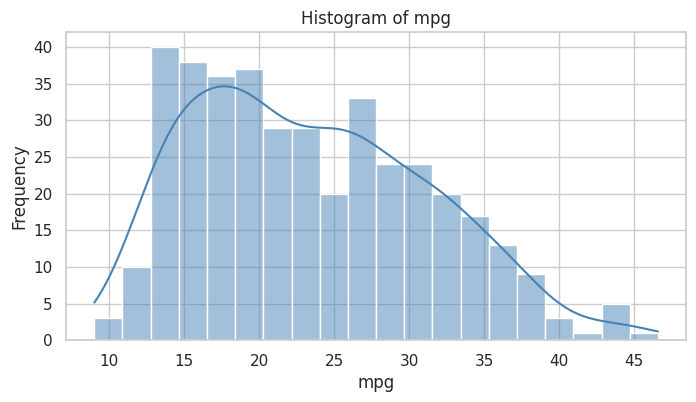


Univariate Analysis for 'cylinders'
count    392.000000
mean       5.471939
std        1.705783
min        3.000000
25%        4.000000
50%        4.000000
75%        8.000000
max        8.000000
Name: cylinders, dtype: float64
IQR (Q3 - Q1): 4.0


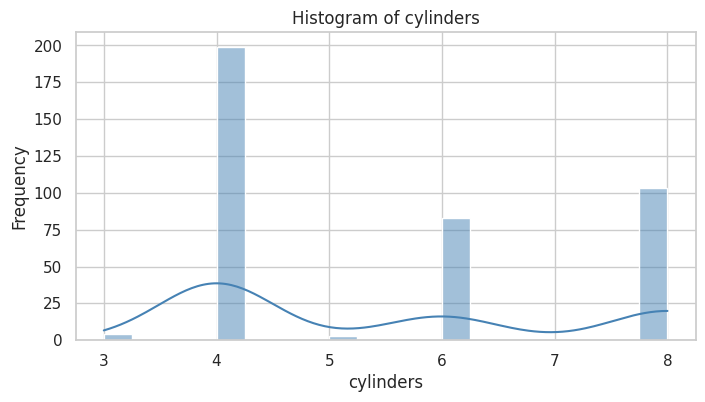


Univariate Analysis for 'displacement'
count    392.000000
mean     194.411990
std      104.644004
min       68.000000
25%      105.000000
50%      151.000000
75%      275.750000
max      455.000000
Name: displacement, dtype: float64
IQR (Q3 - Q1): 170.75


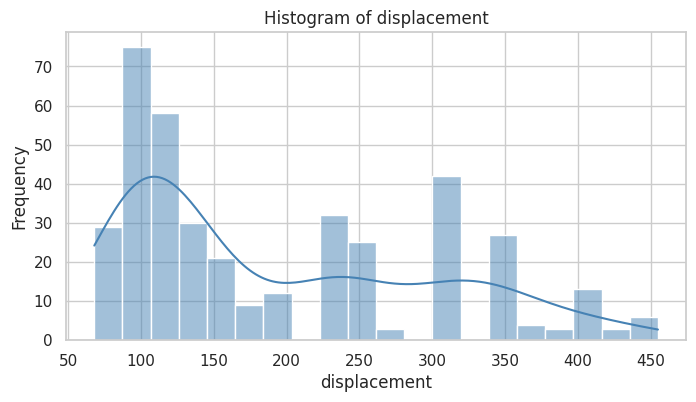


Univariate Analysis for 'horsepower'
count    392.000000
mean     104.469388
std       38.491160
min       46.000000
25%       75.000000
50%       93.500000
75%      126.000000
max      230.000000
Name: horsepower, dtype: float64
IQR (Q3 - Q1): 51.0


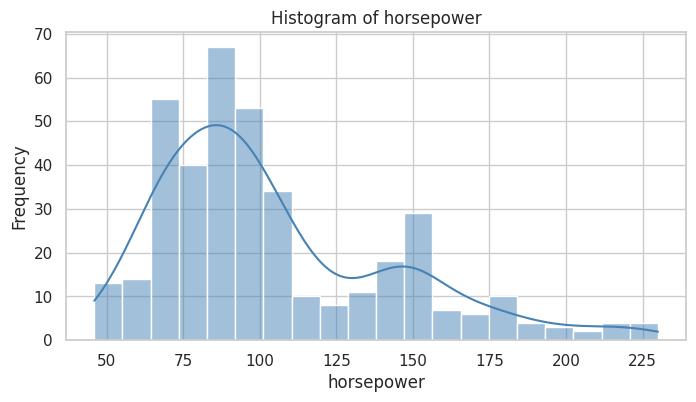


Univariate Analysis for 'weight'
count     392.000000
mean     2977.584184
std       849.402560
min      1613.000000
25%      2225.250000
50%      2803.500000
75%      3614.750000
max      5140.000000
Name: weight, dtype: float64
IQR (Q3 - Q1): 1389.5


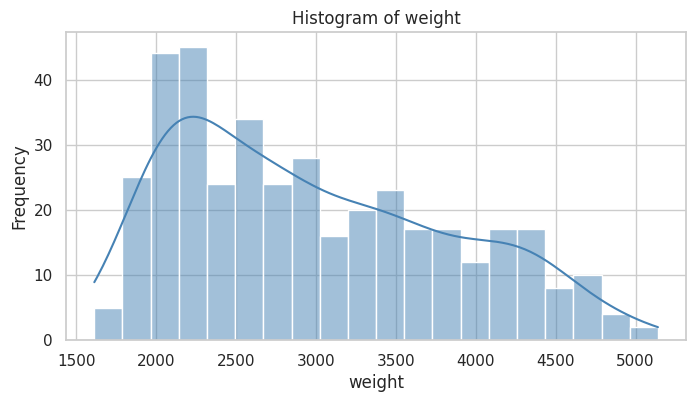


Univariate Analysis for 'acceleration'
count    392.000000
mean      15.541327
std        2.758864
min        8.000000
25%       13.775000
50%       15.500000
75%       17.025000
max       24.800000
Name: acceleration, dtype: float64
IQR (Q3 - Q1): 3.2499999999999982


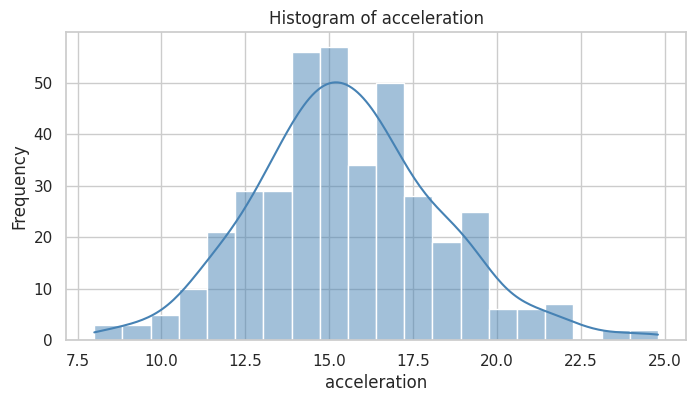


Univariate Analysis for 'year'
count    392.000000
mean      75.979592
std        3.683737
min       70.000000
25%       73.000000
50%       76.000000
75%       79.000000
max       82.000000
Name: year, dtype: float64
IQR (Q3 - Q1): 6.0


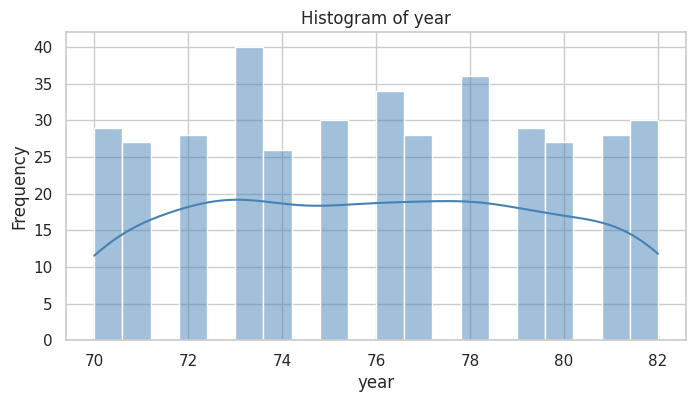


Univariate Analysis for 'origin'
count    392.000000
mean       1.576531
std        0.805518
min        1.000000
25%        1.000000
50%        1.000000
75%        2.000000
max        3.000000
Name: origin, dtype: float64
IQR (Q3 - Q1): 1.0


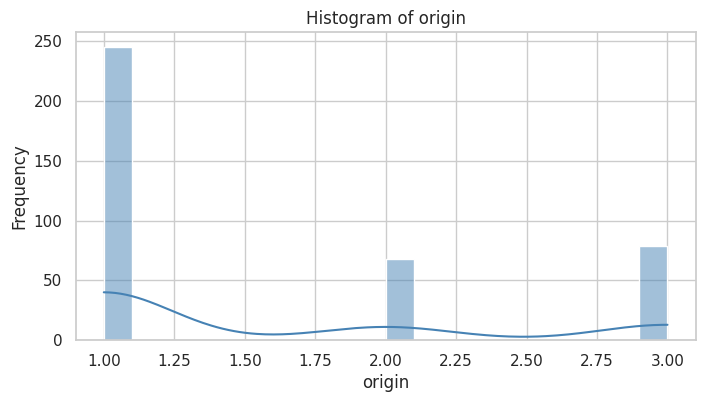


Univariate Analysis for 'name'
name
amc matador        5
toyota corolla     5
ford pinto         5
toyota corona      4
amc hornet         4
                  ..
ford mustang gl    1
vw pickup          1
dodge rampage      1
ford ranger        1
chevy s-10         1
Name: count, Length: 301, dtype: int64


/tmp/ipython-input-3501254432.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=value_counts[:20].values, y=value_counts[:20].index, palette="viridis")


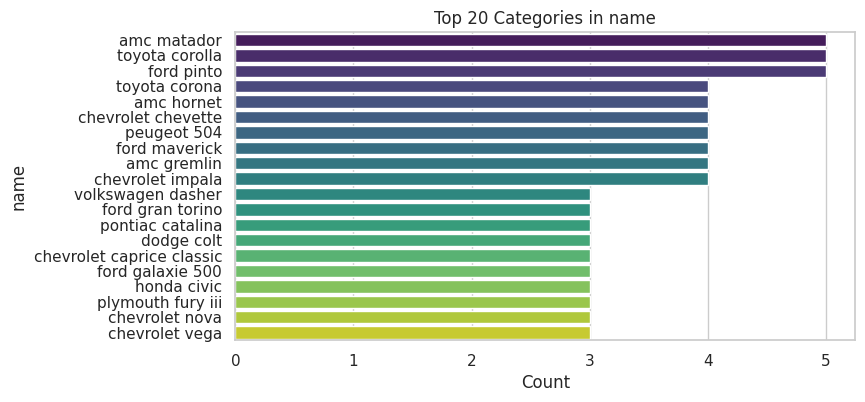

In [ ]:
# Univariate analysis

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
df = pd.read_csv("Auto.csv")
sns.set(style="whitegrid")
def univariate_analysis(df):
    for col in df.columns:
        print(f"\nUnivariate Analysis for '{col}'")
        if pd.api.types.is_numeric_dtype(df[col]):
            print(df[col].describe())
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            print(f"IQR (Q3 - Q1): {IQR}")
            plt.figure(figsize=(8, 4))
            sns.histplot(df[col].dropna(), kde=True, bins=20, color='steelblue')
            plt.title(f"Histogram of {col}")
            plt.xlabel(col)
            plt.ylabel("Frequency")
            plt.show()
        else:
            value_counts = df[col].value_counts(dropna=False)
            print(value_counts)
            plt.figure(figsize=(8, 4))
            if value_counts.shape[0] > 20:
                sns.barplot(x=value_counts[:20].values, y=value_counts[:20].index, palette="viridis")
                plt.title(f"Top 20 Categories in {col}")
            else:
                sns.barplot(x=value_counts.values, y=value_counts.index, palette="viridis")
                plt.title(f"Category Counts in {col}")
            plt.xlabel("Count")
            plt.ylabel(col)
            plt.show()
univariate_analysis(df)

BIVARIATE ANALYSIS
Numeric columns: ['mpg', 'cylinders', 'displacement', 'horsepower', 'weight', 'acceleration', 'year', 'origin']
Categorical columns: ['name']

1. NUMERIC vs NUMERIC ANALYSIS
--------------------------------------------------

Pearson Correlation Matrix:
                 mpg  cylinders  displacement  horsepower  weight  \
mpg           1.0000    -0.7776       -0.8051     -0.7784 -0.8322   
cylinders    -0.7776     1.0000        0.9508      0.8430  0.8975   
displacement -0.8051     0.9508        1.0000      0.8973  0.9330   
horsepower   -0.7784     0.8430        0.8973      1.0000  0.8645   
weight       -0.8322     0.8975        0.9330      0.8645  1.0000   
acceleration  0.4233    -0.5047       -0.5438     -0.6892 -0.4168   
year          0.5805    -0.3456       -0.3699     -0.4164 -0.3091   
origin        0.5652    -0.5689       -0.6145     -0.4552 -0.5850   

              acceleration    year  origin  
mpg                 0.4233  0.5805  0.5652  
cylinders      

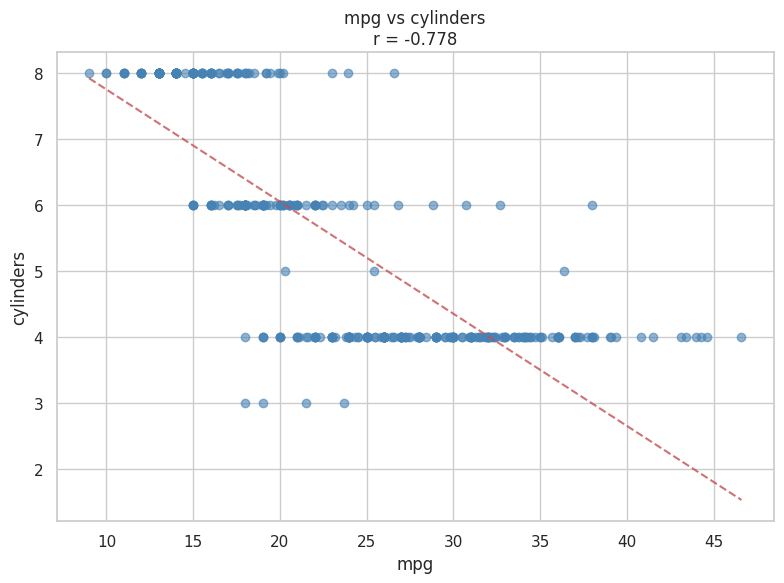


2. MPG vs DISPLACEMENT
----------------------------------------
Pearson Correlation:  -0.8051 (p-value: 0.0000)
Spearman Correlation: -0.8552 (p-value: 0.0000)
Relationship: Very Strong Negative (Significant)


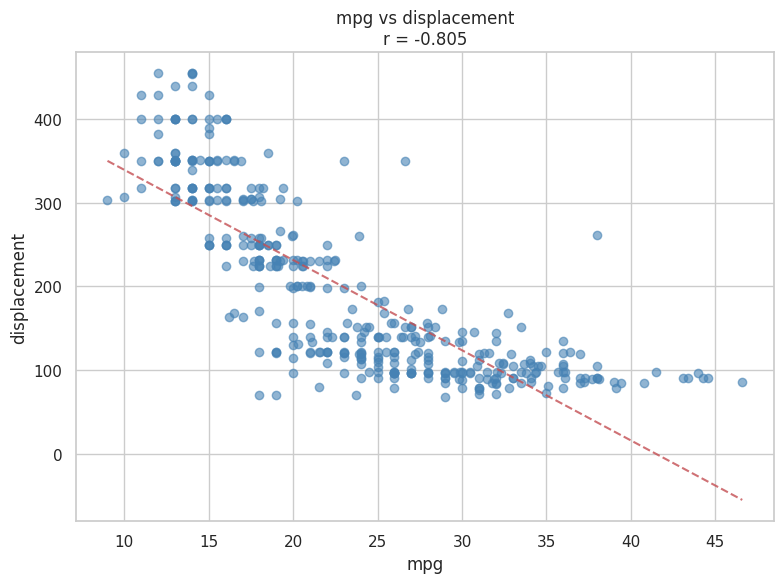


3. MPG vs HORSEPOWER
----------------------------------------
Pearson Correlation:  -0.7784 (p-value: 0.0000)
Spearman Correlation: -0.8536 (p-value: 0.0000)
Relationship: Strong Negative (Significant)


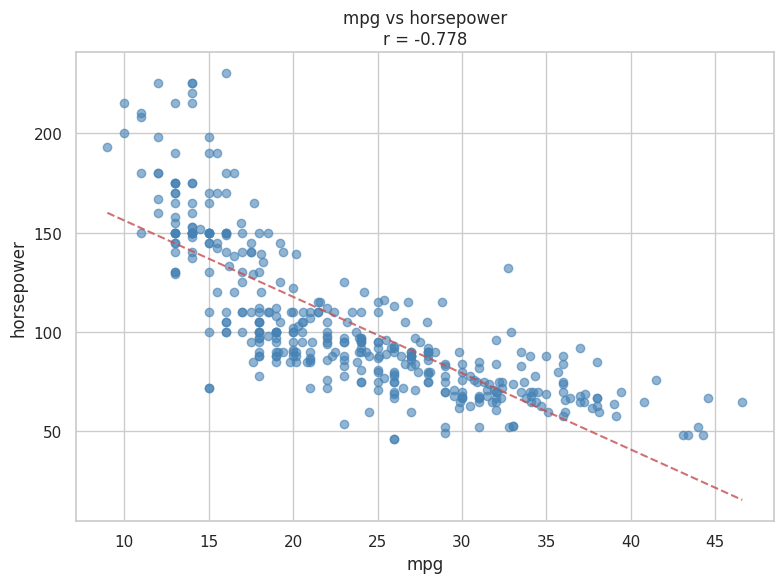


4. MPG vs WEIGHT
----------------------------------------
Pearson Correlation:  -0.8322 (p-value: 0.0000)
Spearman Correlation: -0.8756 (p-value: 0.0000)
Relationship: Very Strong Negative (Significant)


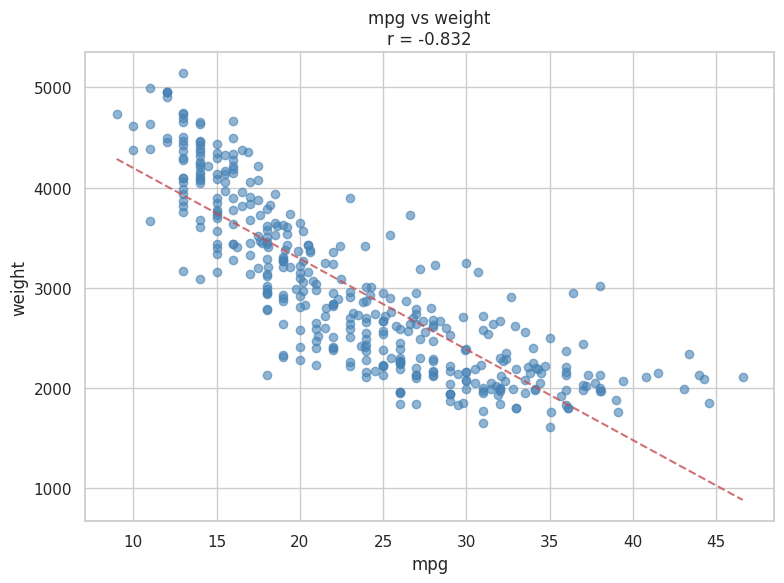


5. MPG vs ACCELERATION
----------------------------------------
Pearson Correlation:  0.4233 (p-value: 0.0000)
Spearman Correlation: 0.4415 (p-value: 0.0000)
Relationship: Moderate Positive (Significant)


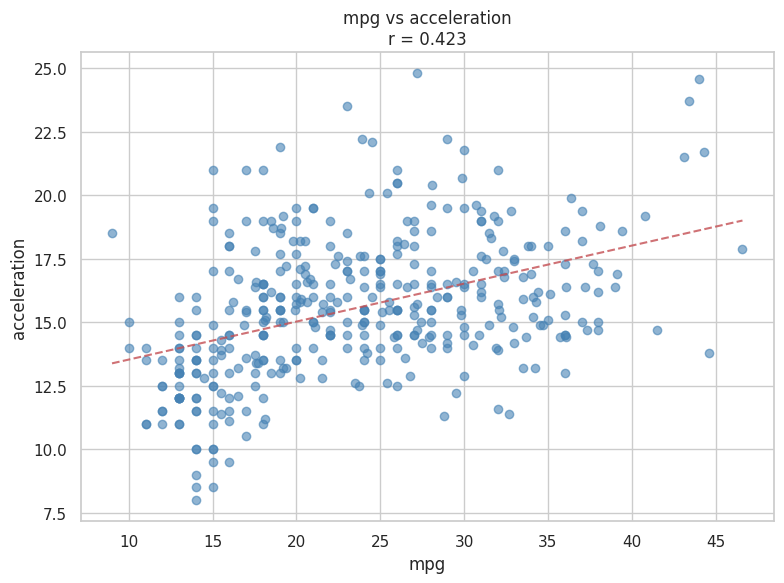


6. MPG vs YEAR
----------------------------------------
Pearson Correlation:  0.5805 (p-value: 0.0000)
Spearman Correlation: 0.5748 (p-value: 0.0000)
Relationship: Moderate Positive (Significant)


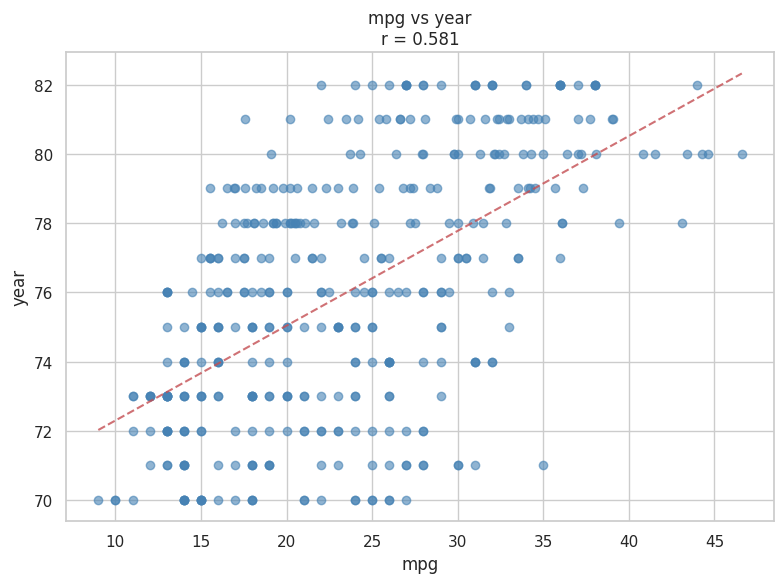


7. MPG vs ORIGIN
----------------------------------------
Pearson Correlation:  0.5652 (p-value: 0.0000)
Spearman Correlation: 0.5805 (p-value: 0.0000)
Relationship: Moderate Positive (Significant)


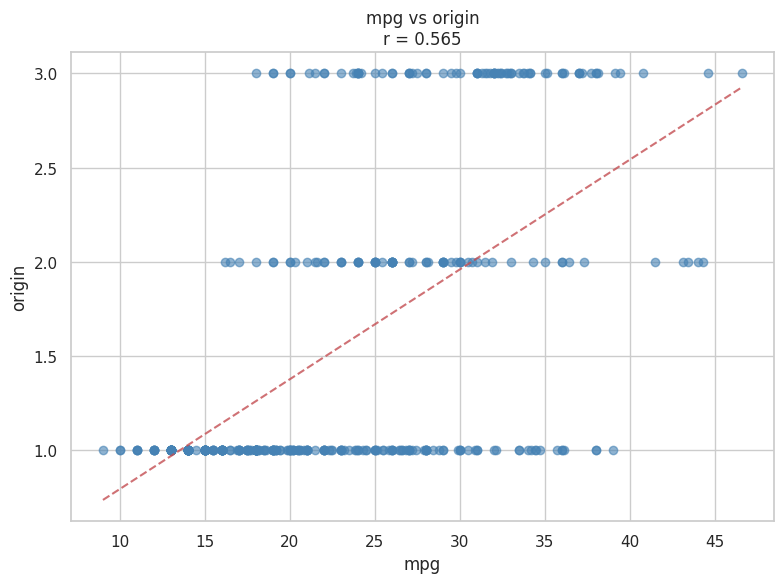


8. CYLINDERS vs DISPLACEMENT
----------------------------------------
Pearson Correlation:  0.9508 (p-value: 0.0000)
Spearman Correlation: 0.9136 (p-value: 0.0000)
Relationship: Very Strong Positive (Significant)


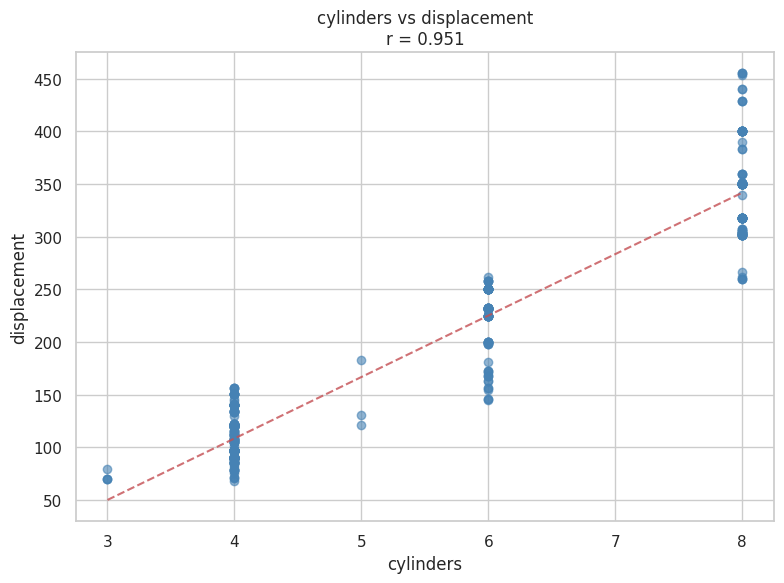


9. CYLINDERS vs HORSEPOWER
----------------------------------------
Pearson Correlation:  0.8430 (p-value: 0.0000)
Spearman Correlation: 0.8162 (p-value: 0.0000)
Relationship: Very Strong Positive (Significant)


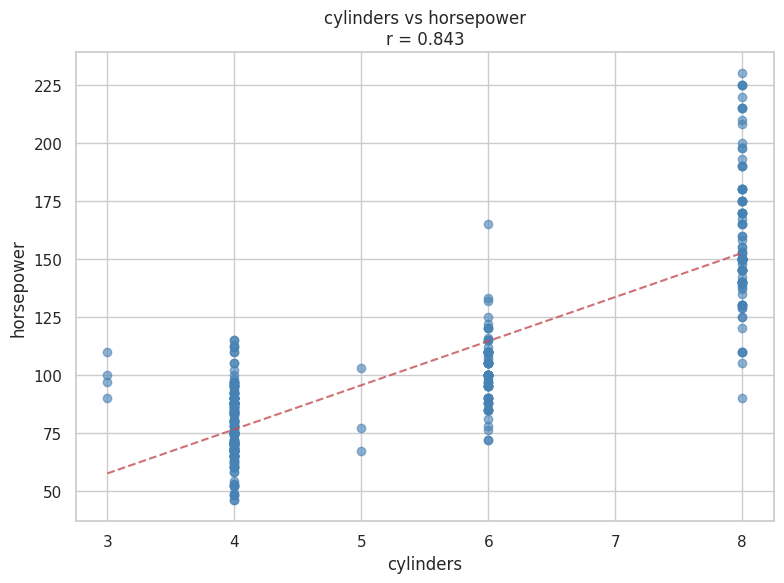


10. CYLINDERS vs WEIGHT
----------------------------------------
Pearson Correlation:  0.8975 (p-value: 0.0000)
Spearman Correlation: 0.8760 (p-value: 0.0000)
Relationship: Very Strong Positive (Significant)


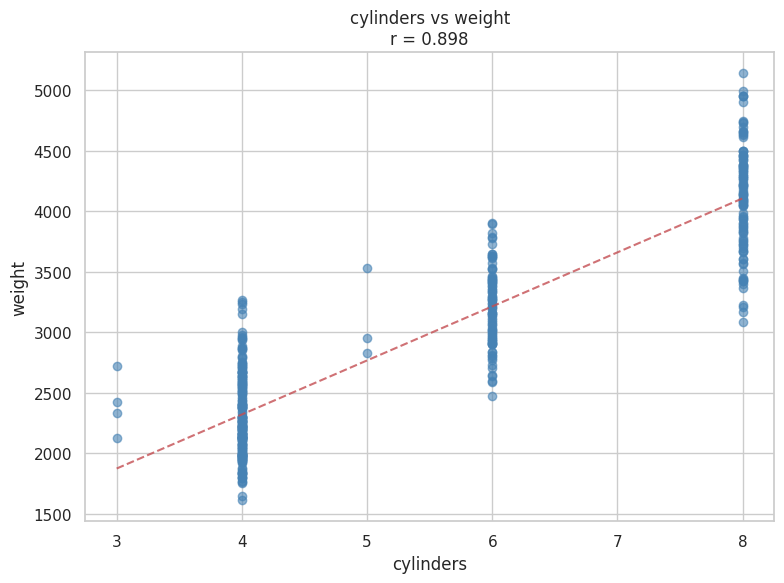


11. CYLINDERS vs ACCELERATION
----------------------------------------
Pearson Correlation:  -0.5047 (p-value: 0.0000)
Spearman Correlation: -0.4763 (p-value: 0.0000)
Relationship: Moderate Negative (Significant)


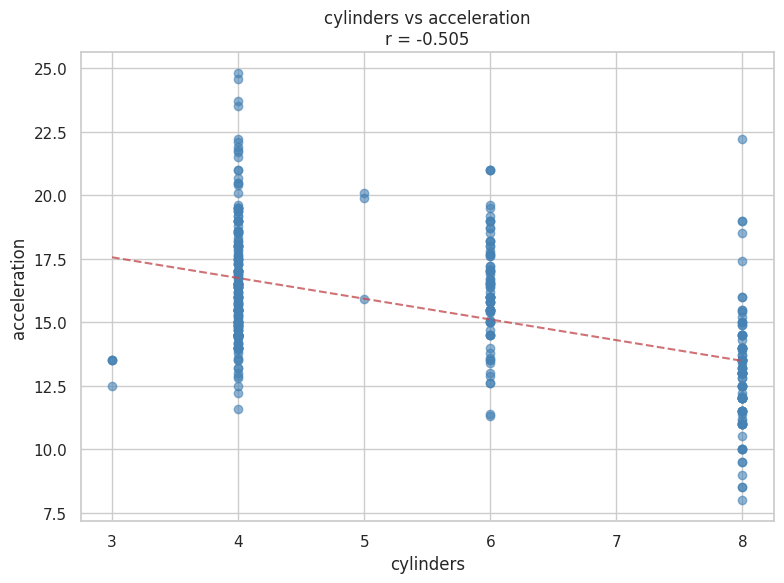


12. CYLINDERS vs YEAR
----------------------------------------
Pearson Correlation:  -0.3456 (p-value: 0.0000)
Spearman Correlation: -0.3311 (p-value: 0.0000)
Relationship: Weak Negative (Significant)


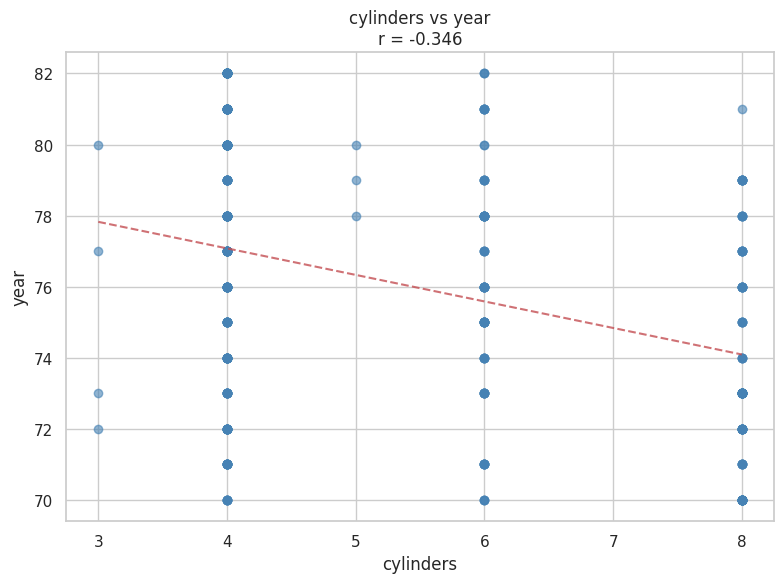


13. CYLINDERS vs ORIGIN
----------------------------------------
Pearson Correlation:  -0.5689 (p-value: 0.0000)
Spearman Correlation: -0.6105 (p-value: 0.0000)
Relationship: Moderate Negative (Significant)


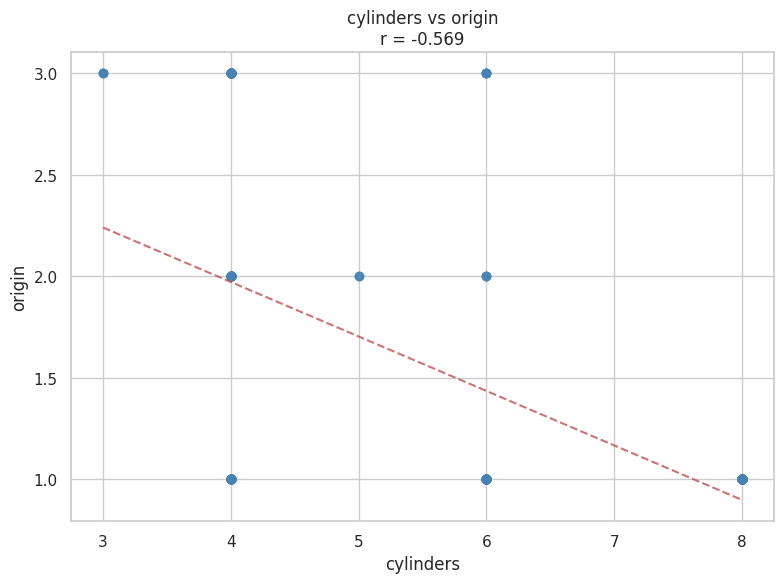


14. DISPLACEMENT vs HORSEPOWER
----------------------------------------
Pearson Correlation:  0.8973 (p-value: 0.0000)
Spearman Correlation: 0.8762 (p-value: 0.0000)
Relationship: Very Strong Positive (Significant)


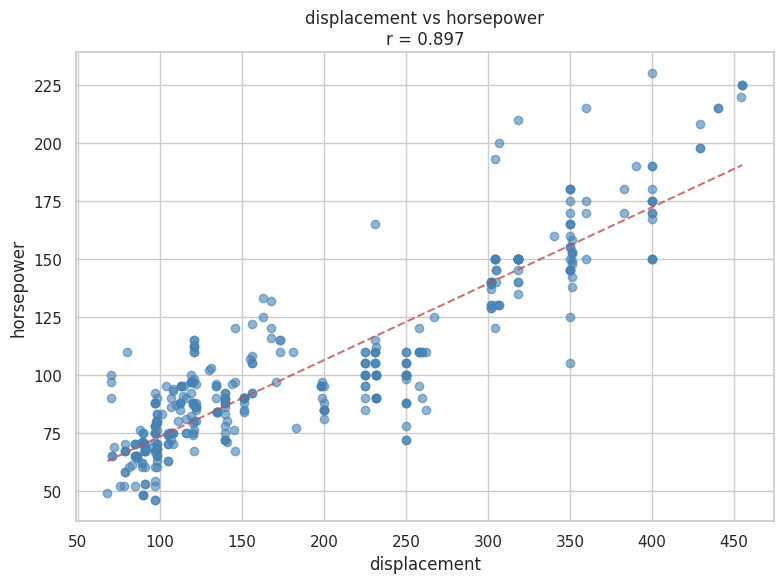


15. DISPLACEMENT vs WEIGHT
----------------------------------------
Pearson Correlation:  0.9330 (p-value: 0.0000)
Spearman Correlation: 0.9456 (p-value: 0.0000)
Relationship: Very Strong Positive (Significant)


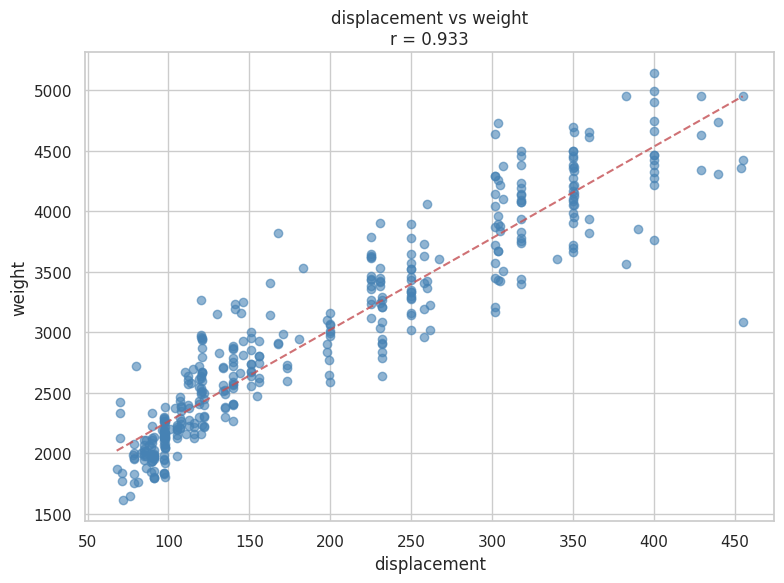


16. DISPLACEMENT vs ACCELERATION
----------------------------------------
Pearson Correlation:  -0.5438 (p-value: 0.0000)
Spearman Correlation: -0.4994 (p-value: 0.0000)
Relationship: Moderate Negative (Significant)


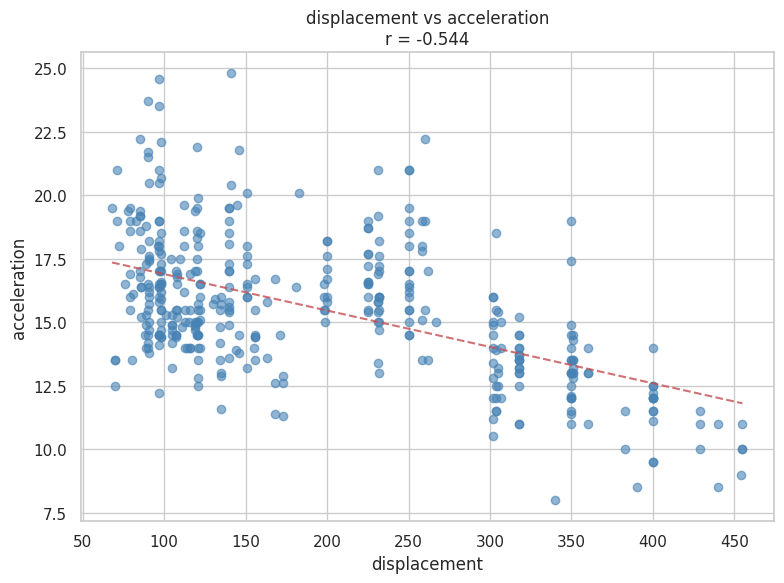


17. DISPLACEMENT vs YEAR
----------------------------------------
Pearson Correlation:  -0.3699 (p-value: 0.0000)
Spearman Correlation: -0.3066 (p-value: 0.0000)
Relationship: Weak Negative (Significant)


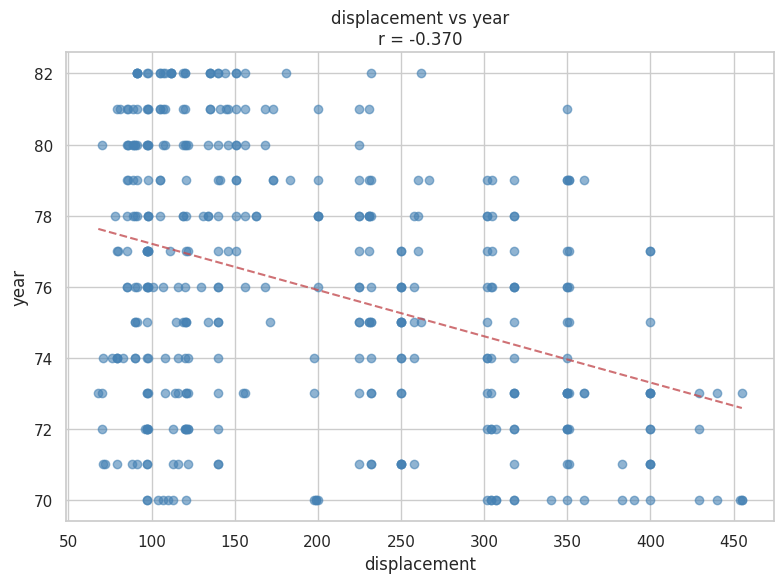


18. DISPLACEMENT vs ORIGIN
----------------------------------------
Pearson Correlation:  -0.6145 (p-value: 0.0000)
Spearman Correlation: -0.7096 (p-value: 0.0000)
Relationship: Strong Negative (Significant)


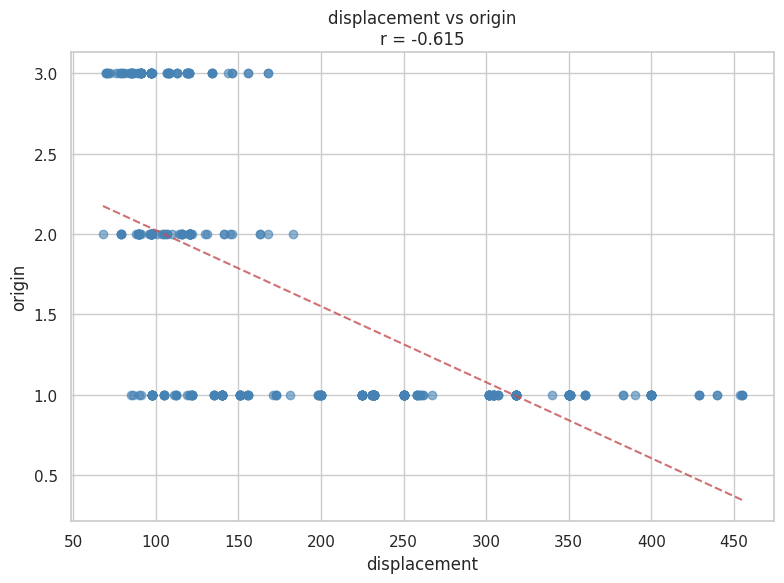


19. HORSEPOWER vs WEIGHT
----------------------------------------
Pearson Correlation:  0.8645 (p-value: 0.0000)
Spearman Correlation: 0.8788 (p-value: 0.0000)
Relationship: Very Strong Positive (Significant)


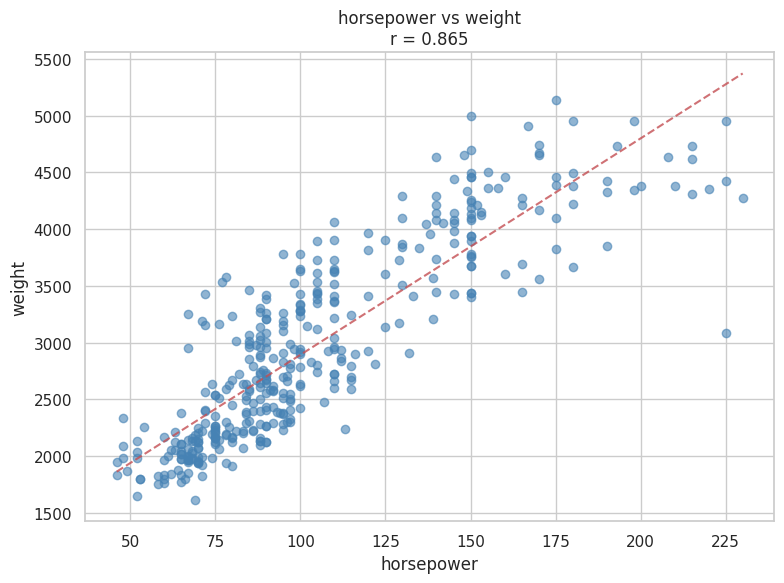


20. HORSEPOWER vs ACCELERATION
----------------------------------------
Pearson Correlation:  -0.6892 (p-value: 0.0000)
Spearman Correlation: -0.6581 (p-value: 0.0000)
Relationship: Strong Negative (Significant)


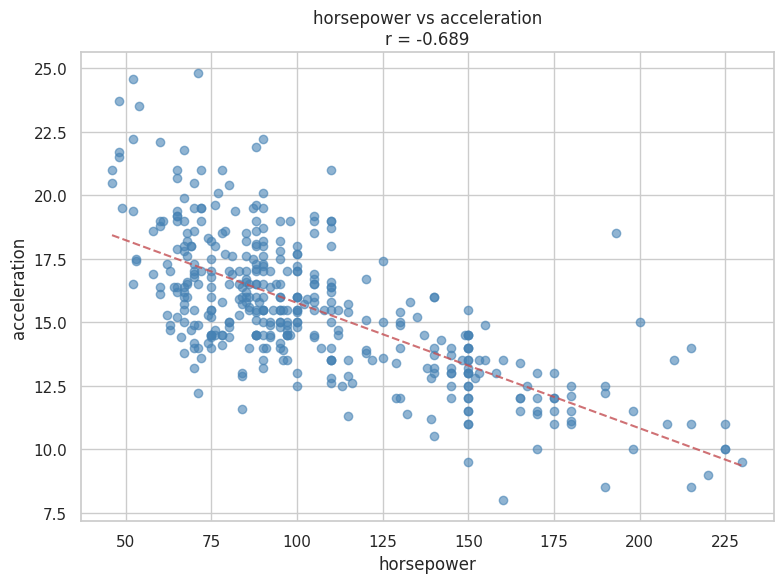


21. HORSEPOWER vs YEAR
----------------------------------------
Pearson Correlation:  -0.4164 (p-value: 0.0000)
Spearman Correlation: -0.3895 (p-value: 0.0000)
Relationship: Moderate Negative (Significant)


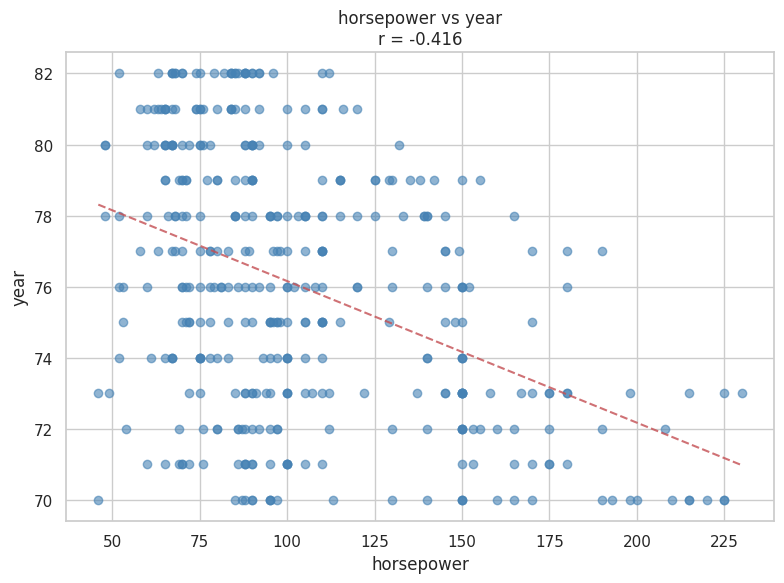


22. HORSEPOWER vs ORIGIN
----------------------------------------
Pearson Correlation:  -0.4552 (p-value: 0.0000)
Spearman Correlation: -0.5090 (p-value: 0.0000)
Relationship: Moderate Negative (Significant)


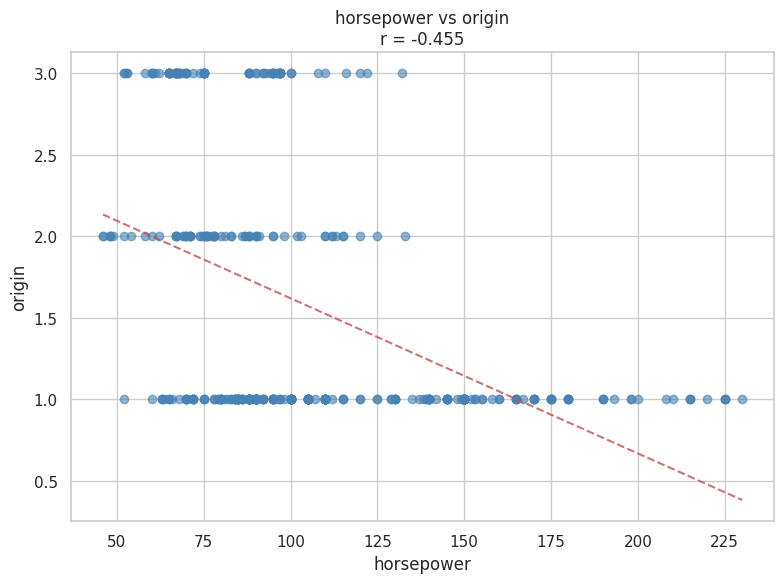


23. WEIGHT vs ACCELERATION
----------------------------------------
Pearson Correlation:  -0.4168 (p-value: 0.0000)
Spearman Correlation: -0.4051 (p-value: 0.0000)
Relationship: Moderate Negative (Significant)


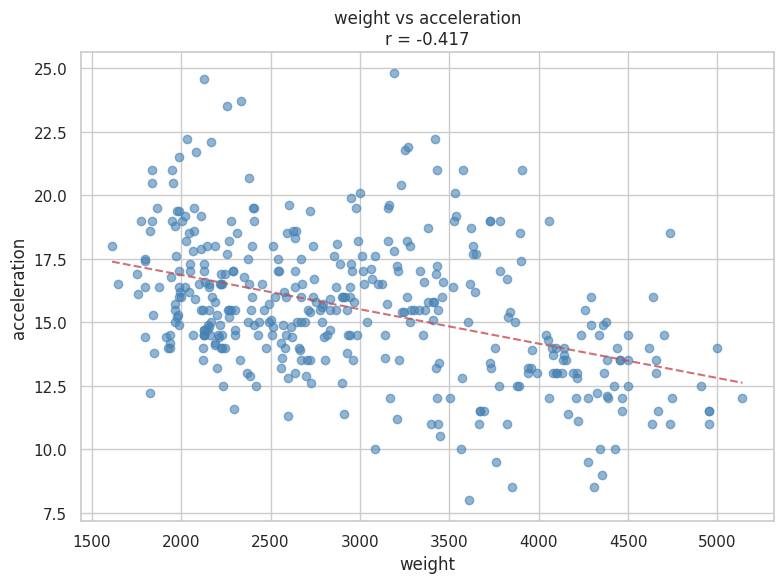


24. WEIGHT vs YEAR
----------------------------------------
Pearson Correlation:  -0.3091 (p-value: 0.0000)
Spearman Correlation: -0.2810 (p-value: 0.0000)
Relationship: Weak Negative (Significant)


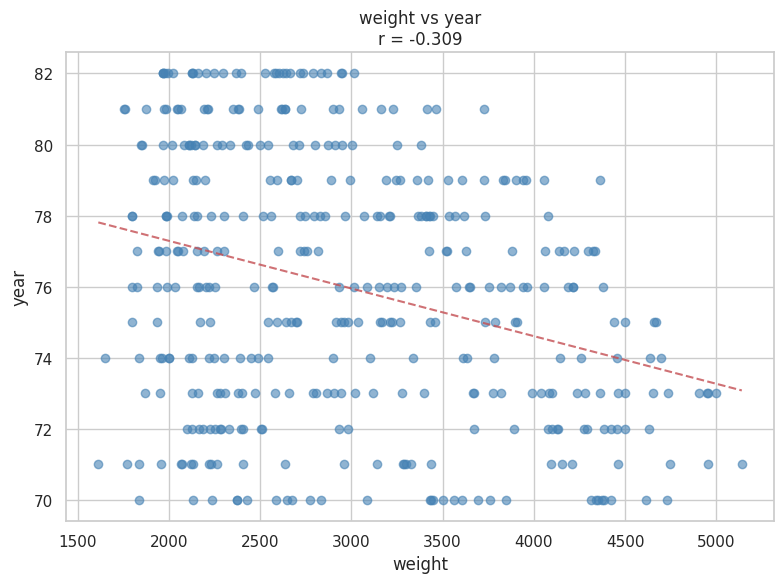


25. WEIGHT vs ORIGIN
----------------------------------------
Pearson Correlation:  -0.5850 (p-value: 0.0000)
Spearman Correlation: -0.6314 (p-value: 0.0000)
Relationship: Moderate Negative (Significant)


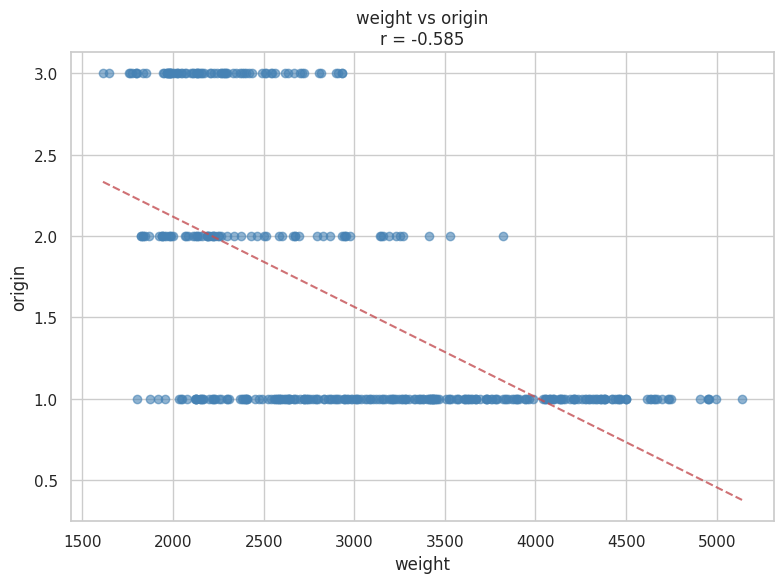


26. ACCELERATION vs YEAR
----------------------------------------
Pearson Correlation:  0.2903 (p-value: 0.0000)
Spearman Correlation: 0.2783 (p-value: 0.0000)
Relationship: Weak Positive (Significant)


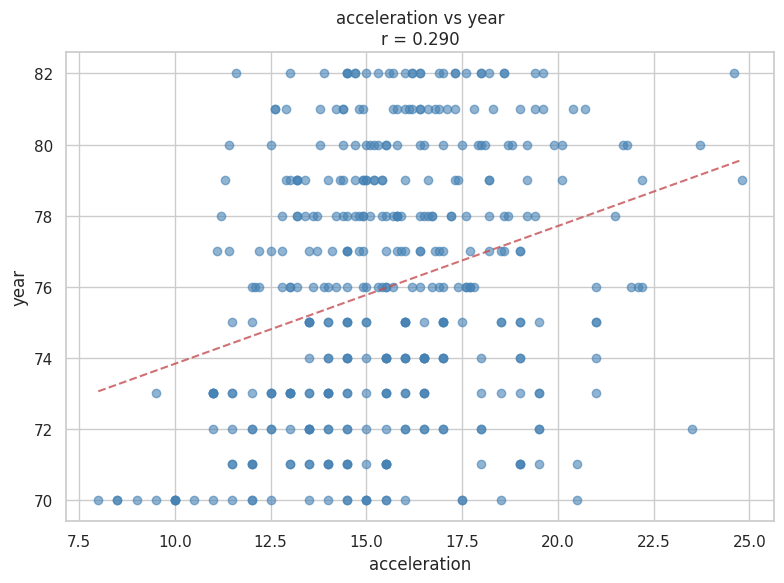


27. ACCELERATION vs ORIGIN
----------------------------------------
Pearson Correlation:  0.2127 (p-value: 0.0000)
Spearman Correlation: 0.2274 (p-value: 0.0000)
Relationship: Weak Positive (Significant)


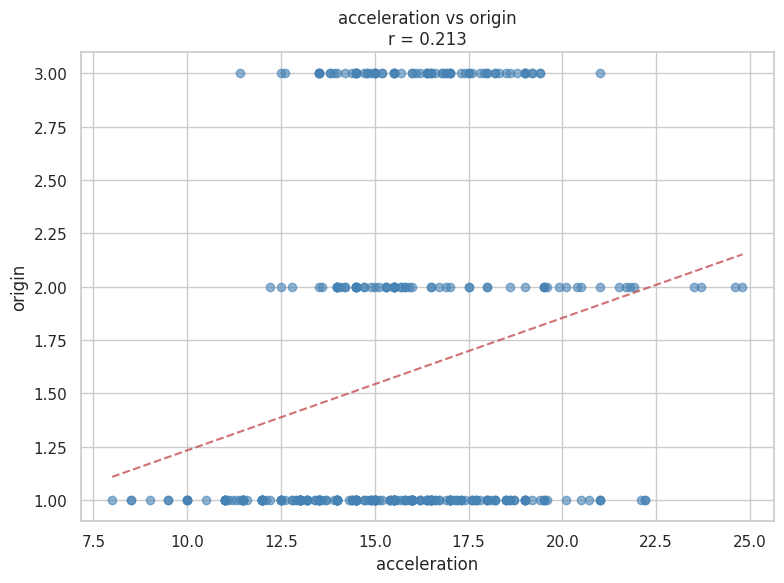


28. YEAR vs ORIGIN
----------------------------------------
Pearson Correlation:  0.1815 (p-value: 0.0003)
Spearman Correlation: 0.1654 (p-value: 0.0010)
Relationship: Very Weak Positive (Significant)


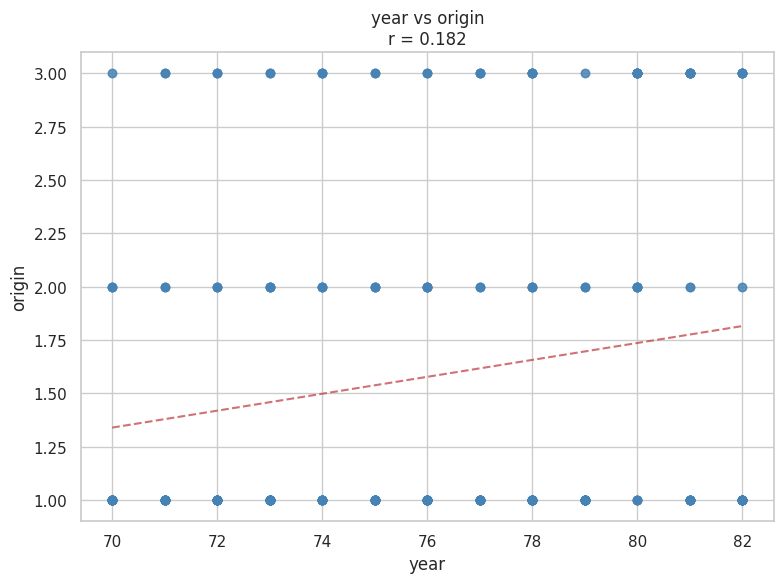

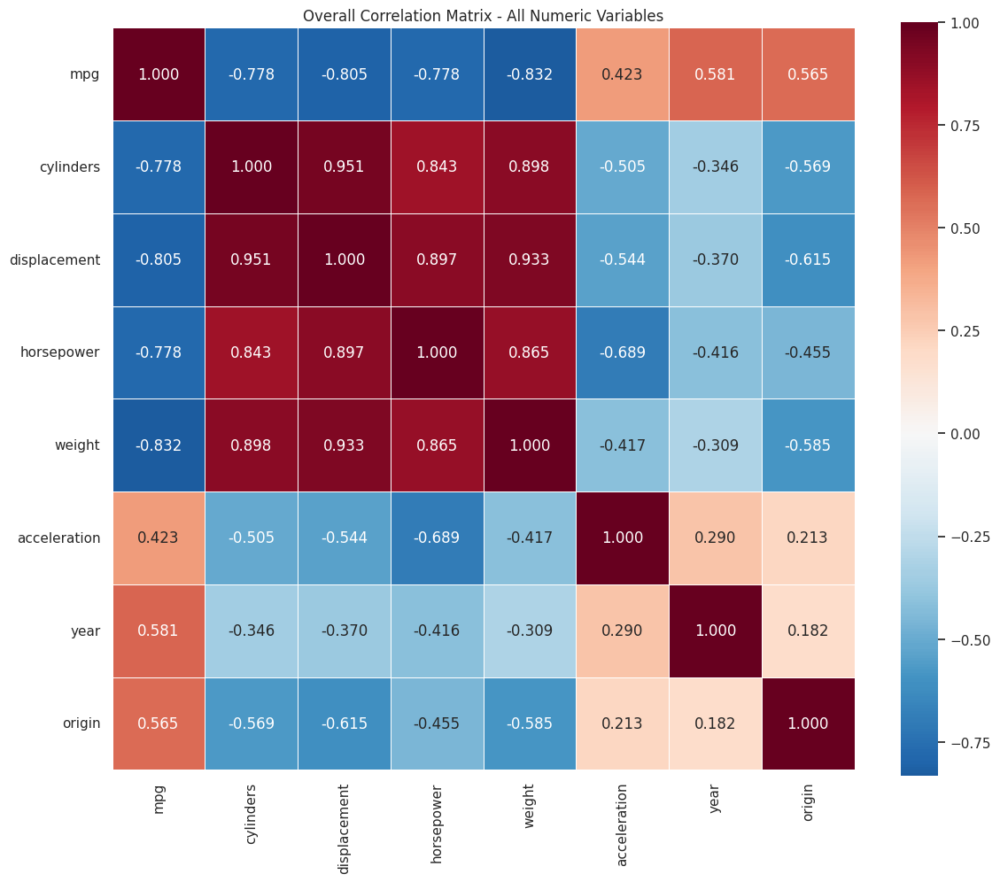



2. NUMERIC vs CATEGORICAL ANALYSIS
--------------------------------------------------

1. MPG vs NAME
----------------------------------------
Showing top 10 categories (out of 301 total)

Group Statistics:
                    count    mean    std   min   max
name                                                
amc gremlin             4  19.500  1.291  18.0  21.0
amc hornet              4  19.375  2.136  18.0  22.5
amc matador             5  15.700  1.483  14.0  18.0
chevrolet chevette      4  30.400  1.294  29.0  32.1
chevrolet impala        4  13.000  1.414  11.0  14.0
ford maverick           4  19.500  3.873  15.0  24.0
ford pinto              5  22.500  3.905  18.0  26.5
peugeot 504             4  23.550  3.485  19.0  27.2
toyota corolla          5  31.120  2.516  28.0  34.0
toyota corona           4  26.875  3.119  24.0  31.0


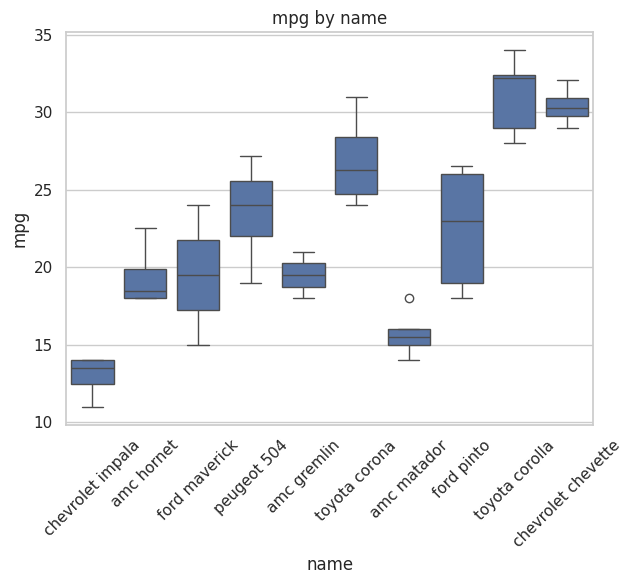


2. CYLINDERS vs NAME
----------------------------------------
Showing top 10 categories (out of 301 total)

Group Statistics:
                    count  mean    std  min  max
name                                            
amc gremlin             4   6.0  0.000    6    6
amc hornet              4   6.0  0.000    6    6
amc matador             5   6.8  1.095    6    8
chevrolet chevette      4   4.0  0.000    4    4
chevrolet impala        4   8.0  0.000    8    8
ford maverick           4   6.0  0.000    6    6
ford pinto              5   4.4  0.894    4    6
peugeot 504             4   4.0  0.000    4    4
toyota corolla          5   4.0  0.000    4    4
toyota corona           4   4.0  0.000    4    4


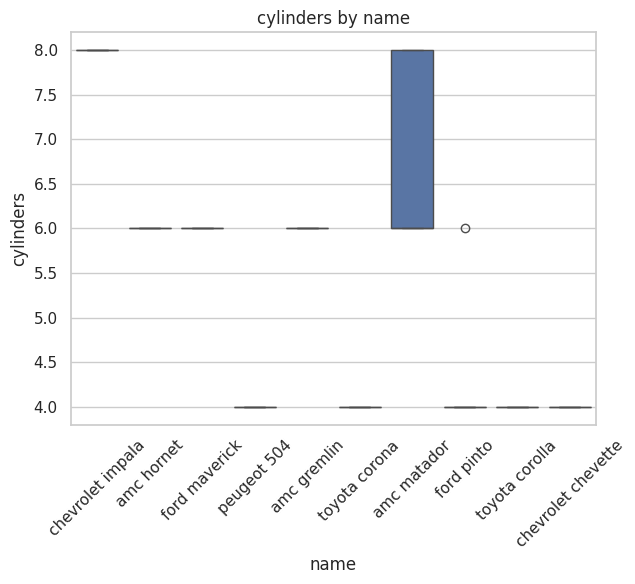


3. DISPLACEMENT vs NAME
----------------------------------------
Showing top 10 categories (out of 301 total)

Group Statistics:
                    count    mean     std    min    max
name                                                   
amc gremlin             4  223.75  16.500  199.0  232.0
amc hornet              4  223.75  16.500  199.0  232.0
amc matador             5  271.20  31.768  232.0  304.0
chevrolet chevette      4   94.75   6.500   85.0   98.0
chevrolet impala        4  388.50  49.622  350.0  454.0
ford maverick           4  225.00  28.868  200.0  250.0
ford pinto              5  139.00  20.025  122.0  171.0
peugeot 504             4  122.75  13.048  110.0  141.0
toyota corolla          5  103.60   6.025   97.0  108.0
toyota corona           4  114.25  27.354   76.0  134.0


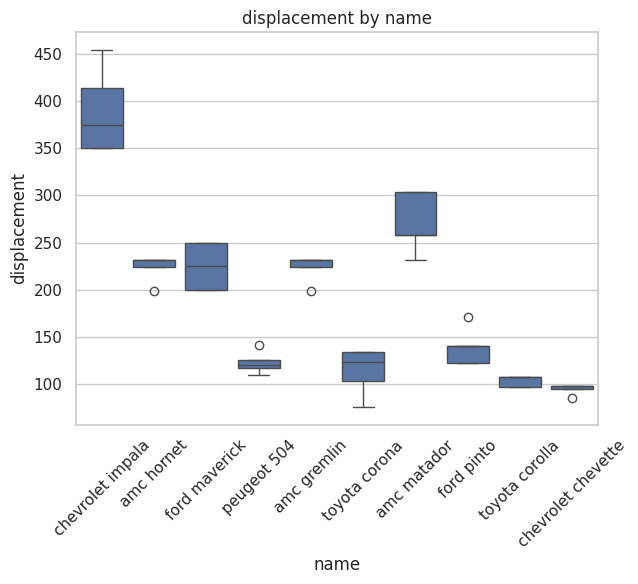


4. HORSEPOWER vs NAME
----------------------------------------
Showing top 10 categories (out of 301 total)

Group Statistics:
                    count    mean     std  min  max
name                                               
amc gremlin             4   97.50   5.000   90  100
amc hornet              4   96.75   4.717   90  100
amc matador             5  118.00  19.235  100  150
chevrolet chevette      4   63.25   8.057   52   70
chevrolet impala        4  175.00  30.822  150  220
ford maverick           4   81.50   6.952   72   88
ford pinto              5   83.40   9.072   72   97
peugeot 504             4   83.50   8.347   71   88
toyota corolla          5   74.00   2.236   70   75
toyota corona           4   84.50  21.672   52   96


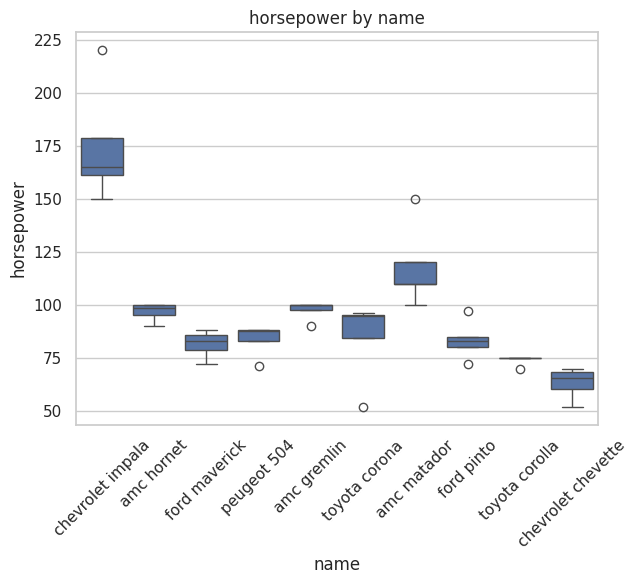


5. WEIGHT vs NAME
----------------------------------------
Showing top 10 categories (out of 301 total)

Group Statistics:
                    count     mean      std   min   max
name                                                   
amc gremlin             4  2746.25  131.935  2634  2914
amc hornet              4  2926.25  128.285  2774  3085
amc matador             5  3656.80  242.572  3288  3962
chevrolet chevette      4  2090.25   56.777  2035  2155
chevrolet impala        4  4458.50  363.865  4209  4997
ford maverick           4  2944.50  247.519  2587  3158
ford pinto              5  2589.80  252.974  2310  2984
peugeot 504             4  3022.25  268.609  2672  3270
toyota corolla          5  2237.20   78.576  2155  2350
toyota corona           4  2284.75  468.067  1649  2702


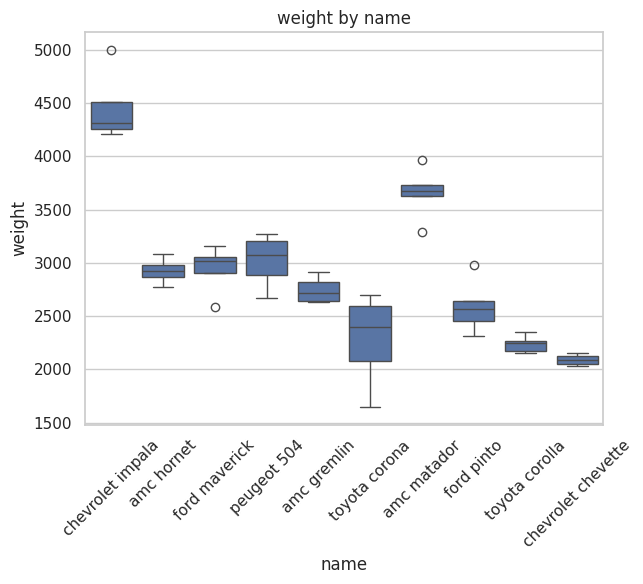


6. ACCELERATION vs NAME
----------------------------------------
Showing top 10 categories (out of 301 total)

Group Statistics:
                    count    mean    std   min   max
name                                                
amc gremlin             4  14.750  1.258  13.0  16.0
amc hornet              4  16.275  0.914  15.5  17.6
amc matador             5  15.580  3.043  11.5  19.0
chevrolet chevette      4  17.800  2.999  15.5  22.2
chevrolet impala        4  11.750  2.062   9.0  14.0
ford maverick           4  17.400  1.551  16.0  19.5
ford pinto              5  16.020  1.969  13.6  18.5
peugeot 504             4  20.300  3.721  17.0  24.8
toyota corolla          5  16.260  0.691  15.2  16.9
toyota corona           4  14.550  1.333  13.5  16.5


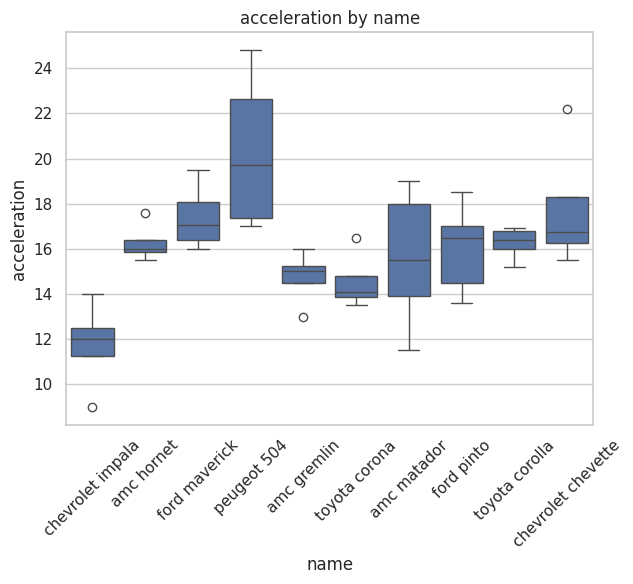


7. YEAR vs NAME
----------------------------------------
Showing top 10 categories (out of 301 total)

Group Statistics:
                    count   mean    std  min  max
name                                             
amc gremlin             4  72.25  2.217   70   75
amc hornet              4  73.25  2.500   70   76
amc matador             5  73.80  1.924   71   76
chevrolet chevette      4  77.75  1.708   76   80
chevrolet impala        4  71.50  1.291   70   73
ford maverick           4  73.50  2.646   70   76
ford pinto              5  74.60  1.140   73   76
peugeot 504             4  75.00  3.742   70   79
toyota corolla          5  78.80  3.114   75   82
toyota corona           4  74.50  2.887   71   78


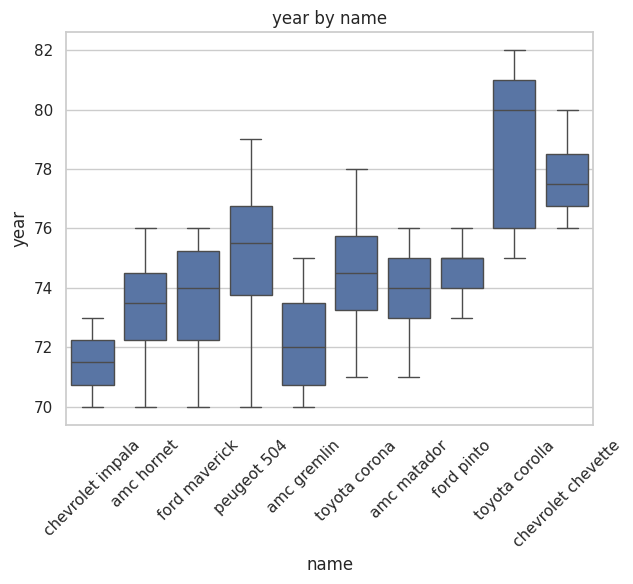


8. ORIGIN vs NAME
----------------------------------------
Showing top 10 categories (out of 301 total)

Group Statistics:
                    count  mean  std  min  max
name                                          
amc gremlin             4   1.0  0.0    1    1
amc hornet              4   1.0  0.0    1    1
amc matador             5   1.0  0.0    1    1
chevrolet chevette      4   1.0  0.0    1    1
chevrolet impala        4   1.0  0.0    1    1
ford maverick           4   1.0  0.0    1    1
ford pinto              5   1.0  0.0    1    1
peugeot 504             4   2.0  0.0    2    2
toyota corolla          5   3.0  0.0    3    3
toyota corona           4   3.0  0.0    3    3


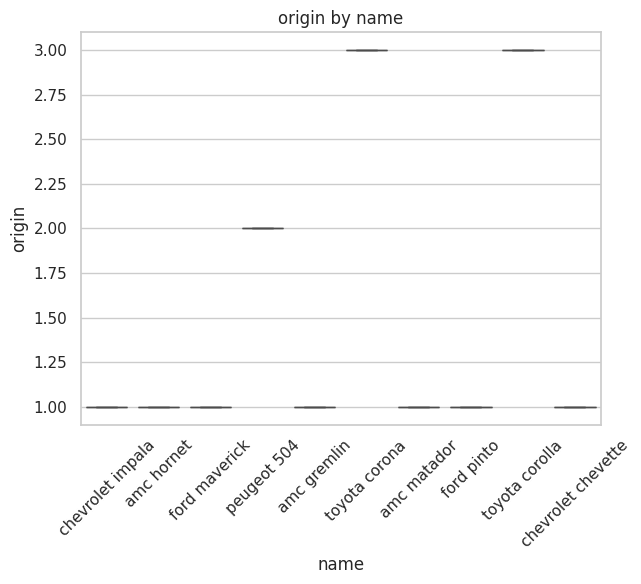



4. CORRELATION SUMMARY TABLE
--------------------------------------------------

Top Correlations (sorted by absolute value):
  Variable 1   Variable 2  Correlation  P-value Significance    Strength
   cylinders displacement       0.9508   0.0000          Yes Very Strong
displacement       weight       0.9330   0.0000          Yes Very Strong
   cylinders       weight       0.8975   0.0000          Yes Very Strong
displacement   horsepower       0.8973   0.0000          Yes Very Strong
  horsepower       weight       0.8645   0.0000          Yes Very Strong
   cylinders   horsepower       0.8430   0.0000          Yes Very Strong
         mpg       weight      -0.8322   0.0000          Yes Very Strong
         mpg displacement      -0.8051   0.0000          Yes Very Strong
         mpg   horsepower      -0.7784   0.0000          Yes      Strong
         mpg    cylinders      -0.7776   0.0000          Yes      Strong
  horsepower acceleration      -0.6892   0.0000          Yes      Str

<Figure size 1500x1200 with 0 Axes>

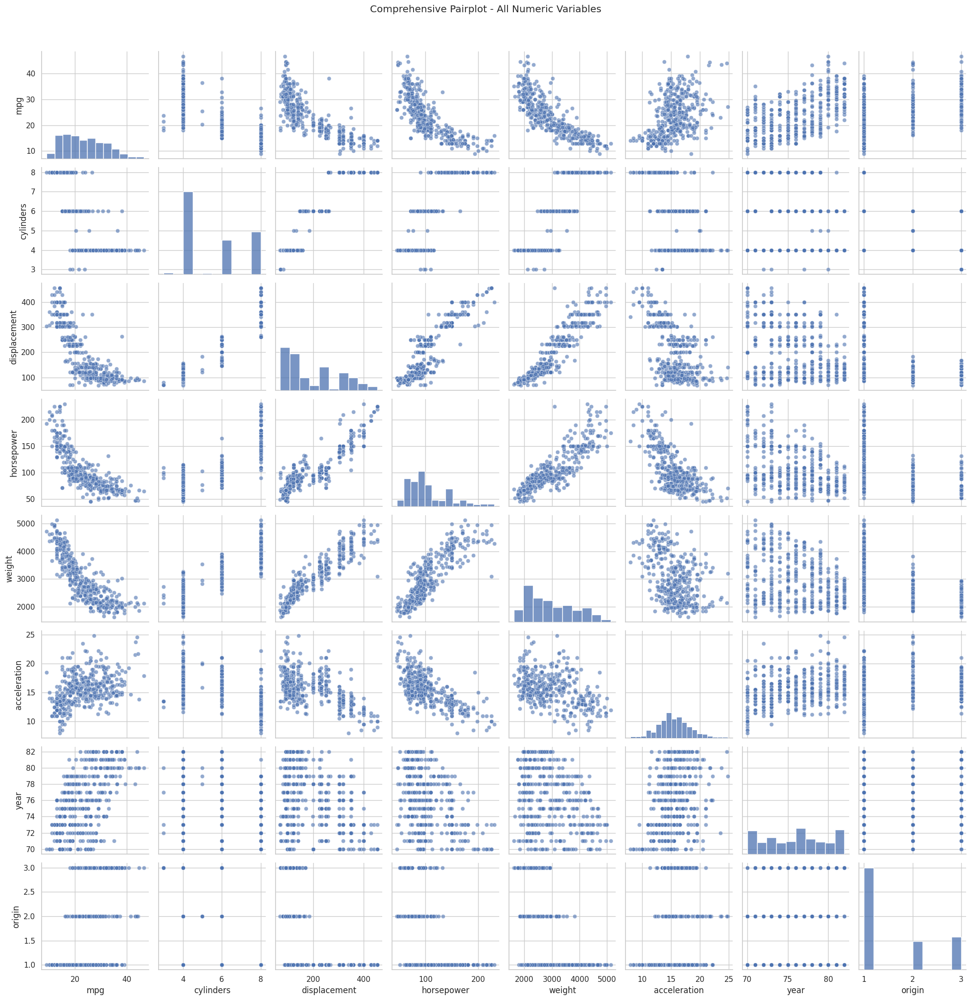

In [ ]:
# Bivariate analysis

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr, chi2_contingency
from itertools import combinations
import warnings
warnings.filterwarnings('ignore')
df = pd.read_csv("Auto.csv")

def comprehensive_bivariate_analysis(df):
    """
    Performing comprehensive bivariate analysis between all pairs of variables
    """
    numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    categorical_cols = df.select_dtypes(include=['object']).columns.tolist()
    print("="*80)
    print("BIVARIATE ANALYSIS")
    print("="*80)
    print(f"Numeric columns: {numeric_cols}")
    print(f"Categorical columns: {categorical_cols}")
    print("="*80)

# 1. NUMERIC vs NUMERIC ANALYSIS
    print("\n1. NUMERIC vs NUMERIC ANALYSIS")
    print("-"*50)
    correlation_matrix = df[numeric_cols].corr()
    print("\nPearson Correlation Matrix:")
    print(correlation_matrix.round(4))
    numeric_pairs = list(combinations(numeric_cols, 2))
    for i, (col1, col2) in enumerate(numeric_pairs):
        print(f"\n{i+1}. {col1.upper()} vs {col2.upper()}")
        print("-" * 40)
        pearson_corr, pearson_p = pearsonr(df[col1], df[col2])
        spearman_corr, spearman_p = spearmanr(df[col1], df[col2])
        print(f"Pearson Correlation:  {pearson_corr:.4f} (p-value: {pearson_p:.4f})")
        print(f"Spearman Correlation: {spearman_corr:.4f} (p-value: {spearman_p:.4f})")
        correlation = abs(pearson_corr)
        if correlation >= 0.8:
            strength = "Very Strong"
        elif correlation >= 0.6:
            strength = "Strong"
        elif correlation >= 0.4:
            strength = "Moderate"
        elif correlation >= 0.2:
            strength = "Weak"
        else:
            strength = "Very Weak"
        direction = "Positive" if pearson_corr > 0 else "Negative"
        significance = "Significant" if pearson_p < 0.05 else "Not Significant"

        print(f"Relationship: {strength} {direction} ({significance})")

        # Creating scatter plot
        plt.figure(figsize=(8, 6))
        plt.scatter(df[col1], df[col2], alpha=0.6, color='steelblue')
        plt.xlabel(col1)
        plt.ylabel(col2)
        plt.title(f'{col1} vs {col2}\nr = {pearson_corr:.3f}')

        z = np.polyfit(df[col1], df[col2], 1)
        p = np.poly1d(z)
        plt.plot(df[col1].sort_values(), p(df[col1].sort_values()), "r--", alpha=0.8)

        plt.tight_layout()
        plt.show()

    # Overall correlation heatmap
    plt.figure(figsize=(12, 10))
    sns.heatmap(correlation_matrix, annot=True, cmap='RdBu_r', center=0,
                square=True, fmt='.3f', linewidths=0.5)
    plt.title('Overall Correlation Matrix - All Numeric Variables')
    plt.tight_layout()
    plt.show()

# 2. NUMERIC vs CATEGORICAL ANALYSIS
    print("\n\n2. NUMERIC vs CATEGORICAL ANALYSIS")
    print("-"*50)
    for i, (num_col, cat_col) in enumerate([(n, c) for n in numeric_cols for c in categorical_cols]):
        print(f"\n{i+1}. {num_col.upper()} vs {cat_col.upper()}")
        print("-" * 40)
        unique_cats = df[cat_col].nunique()
        if unique_cats > 10:
            top_categories = df[cat_col].value_counts().head(10).index
            df_filtered = df[df[cat_col].isin(top_categories)]
            print(f"Showing top 10 categories (out of {unique_cats} total)")
        else:
            df_filtered = df.copy()
            print(f"Total categories: {unique_cats}")

        group_stats = df_filtered.groupby(cat_col)[num_col].agg([
            'count', 'mean', 'std', 'min', 'max'
        ]).round(3)
        print("\nGroup Statistics:")
        print(group_stats)

        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        sns.boxplot(data=df_filtered, x=cat_col, y=num_col)
        plt.xticks(rotation=45)
        plt.title(f'{num_col} by {cat_col}')
        plt.tight_layout()
        plt.show()

# 3. CATEGORICAL vs CATEGORICAL ANALYSIS
    if len(categorical_cols) >= 2:
        print("\n\n3. CATEGORICAL vs CATEGORICAL ANALYSIS")
        print("-"*50)

        cat_pairs = list(combinations(categorical_cols, 2))

        for i, (cat1, cat2) in enumerate(cat_pairs):
            print(f"\n{i+1}. {cat1.upper()} vs {cat2.upper()}")
            print("-" * 40)

            crosstab = pd.crosstab(df[cat1], df[cat2], margins=True)
            print("Cross-tabulation:")
            print(crosstab)

            chi2_crosstab = pd.crosstab(df[cat1], df[cat2])
            if chi2_crosstab.shape[0] > 1 and chi2_crosstab.shape[1] > 1:
                chi2, p_value, dof, expected = chi2_contingency(chi2_crosstab)
                print(f"\nChi-square statistic: {chi2:.4f}")
                print(f"P-value: {p_value:.4f}")
                print(f"Degrees of freedom: {dof}")
                significance = "Significant" if p_value < 0.05 else "Not Significant"
                print(f"Association: {significance}")

            plt.figure(figsize=(12, 5))

            # Heatmap
            plt.subplot(1, 2, 1)
            sns.heatmap(chi2_crosstab, annot=True, fmt='d', cmap='Blues')
            plt.title(f'Cross-tabulation Heatmap\n{cat1} vs {cat2}')

            # Stacked bar chart
            plt.subplot(1, 2, 2)
            chi2_crosstab.plot(kind='bar', stacked=True, ax=plt.gca())
            plt.title(f'Stacked Bar Chart\n{cat1} vs {cat2}')
            plt.xticks(rotation=45)
            plt.legend(title=cat2, bbox_to_anchor=(1.05, 1), loc='upper left')

            plt.tight_layout()
            plt.show()

# 4. CORRELATION SUMMARY TABLE
    print("\n\n4. CORRELATION SUMMARY TABLE")
    print("-"*50)
    correlation_summary = []
    for col1, col2 in combinations(numeric_cols, 2):
        corr, p_val = pearsonr(df[col1], df[col2])
        correlation_summary.append({
            'Variable 1': col1,
            'Variable 2': col2,
            'Correlation': round(corr, 4),
            'P-value': round(p_val, 4),
            'Significance': 'Yes' if p_val < 0.05 else 'No',
            'Strength': 'Very Strong' if abs(corr) >= 0.8 else
                       'Strong' if abs(corr) >= 0.6 else
                       'Moderate' if abs(corr) >= 0.4 else
                       'Weak' if abs(corr) >= 0.2 else 'Very Weak'
        })
    summary_df = pd.DataFrame(correlation_summary)
    summary_df = summary_df.sort_values('Correlation', key=abs, ascending=False)
    print("\nTop Correlations (sorted by absolute value):")
    print(summary_df.to_string(index=False))
    return summary_df
summary_results = comprehensive_bivariate_analysis(df)
print("\n\n5. COMPREHENSIVE PAIRPLOT")
print("-"*50)
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
if len(numeric_cols) <= 8:
    plt.figure(figsize=(15, 12))
    sns.pairplot(df[numeric_cols], diag_kind='hist', plot_kws={'alpha': 0.6})
    plt.suptitle('Comprehensive Pairplot - All Numeric Variables', y=1.02)
    plt.tight_layout()
    plt.show()
else:
    print("Too many variables for pairplot. Individual plots shown above.")

MULTIVARIATE ANALYSIS
Analyzing 8 numeric variables: ['mpg', 'cylinders', 'displacement', 'horsepower', 'weight', 'acceleration', 'year', 'origin']
Dataset shape: (392, 9)

1. MULTIPLE CORRELATION MATRICES
--------------------------------------------------

Pearson Correlation Matrix:
                 mpg  cylinders  displacement  horsepower  weight  \
mpg           1.0000    -0.7776       -0.8051     -0.7784 -0.8322   
cylinders    -0.7776     1.0000        0.9508      0.8430  0.8975   
displacement -0.8051     0.9508        1.0000      0.8973  0.9330   
horsepower   -0.7784     0.8430        0.8973      1.0000  0.8645   
weight       -0.8322     0.8975        0.9330      0.8645  1.0000   
acceleration  0.4233    -0.5047       -0.5438     -0.6892 -0.4168   
year          0.5805    -0.3456       -0.3699     -0.4164 -0.3091   
origin        0.5652    -0.5689       -0.6145     -0.4552 -0.5850   

              acceleration    year  origin  
mpg                 0.4233  0.5805  0.5652  
cy

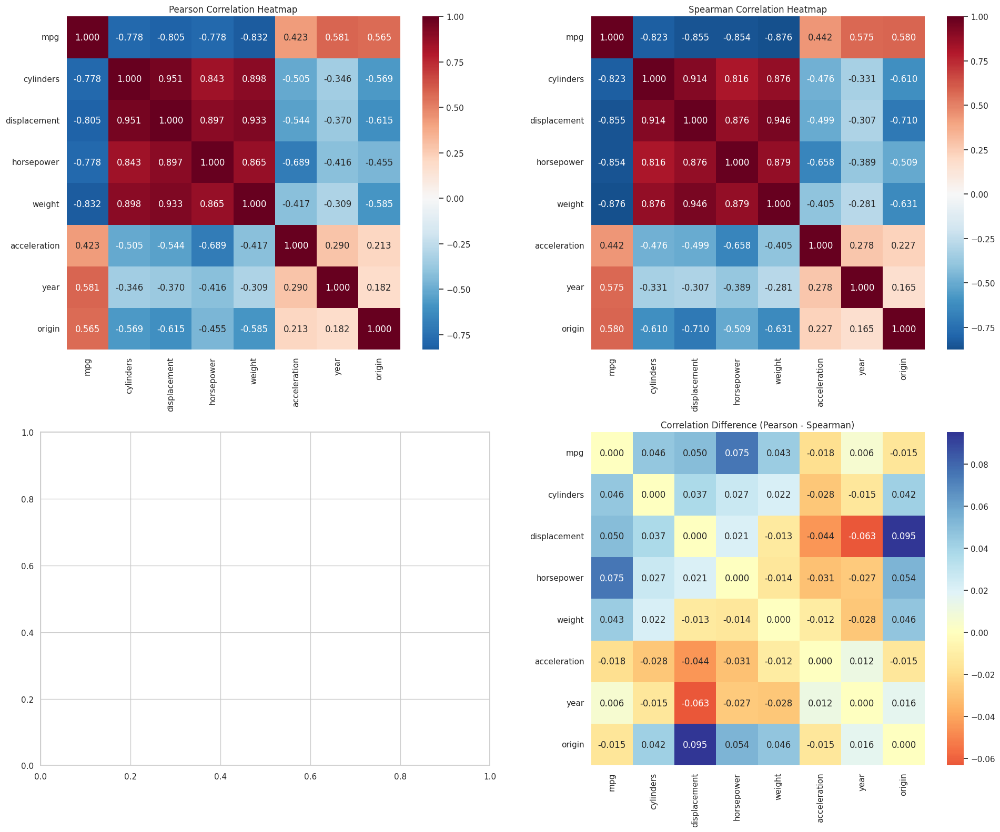


3. HIERARCHICAL CLUSTERING OF CORRELATIONS
--------------------------------------------------


<Figure size 1200x1000 with 0 Axes>

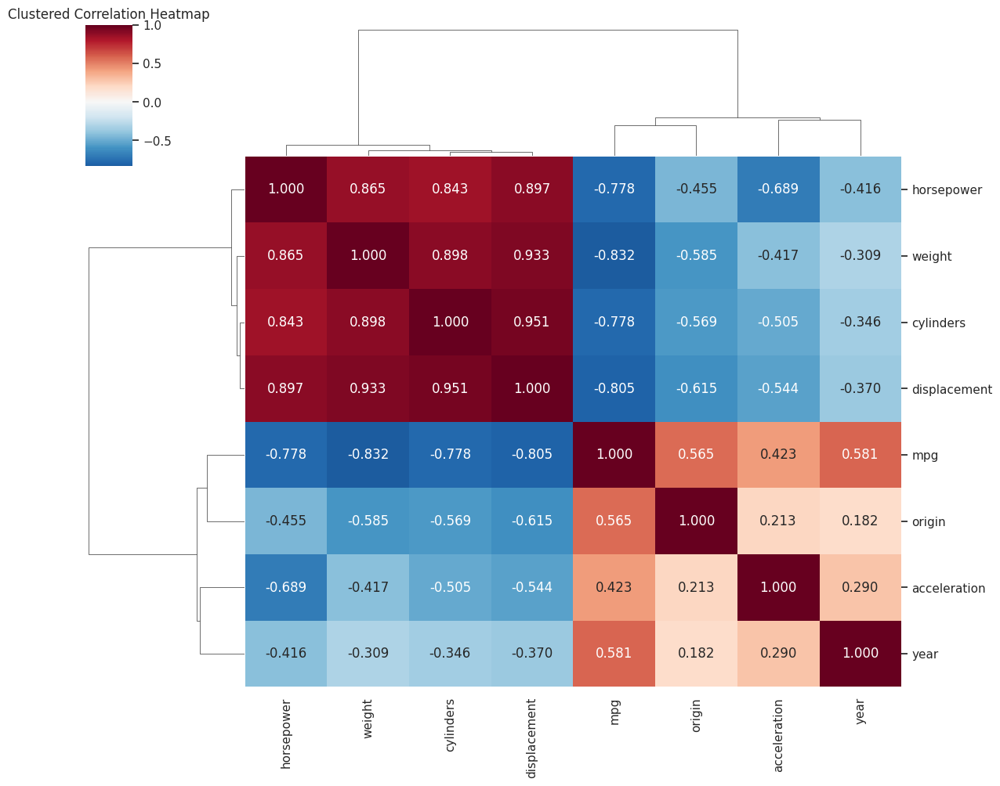


4. COMPREHENSIVE PAIRPLOT ANALYSIS
--------------------------------------------------


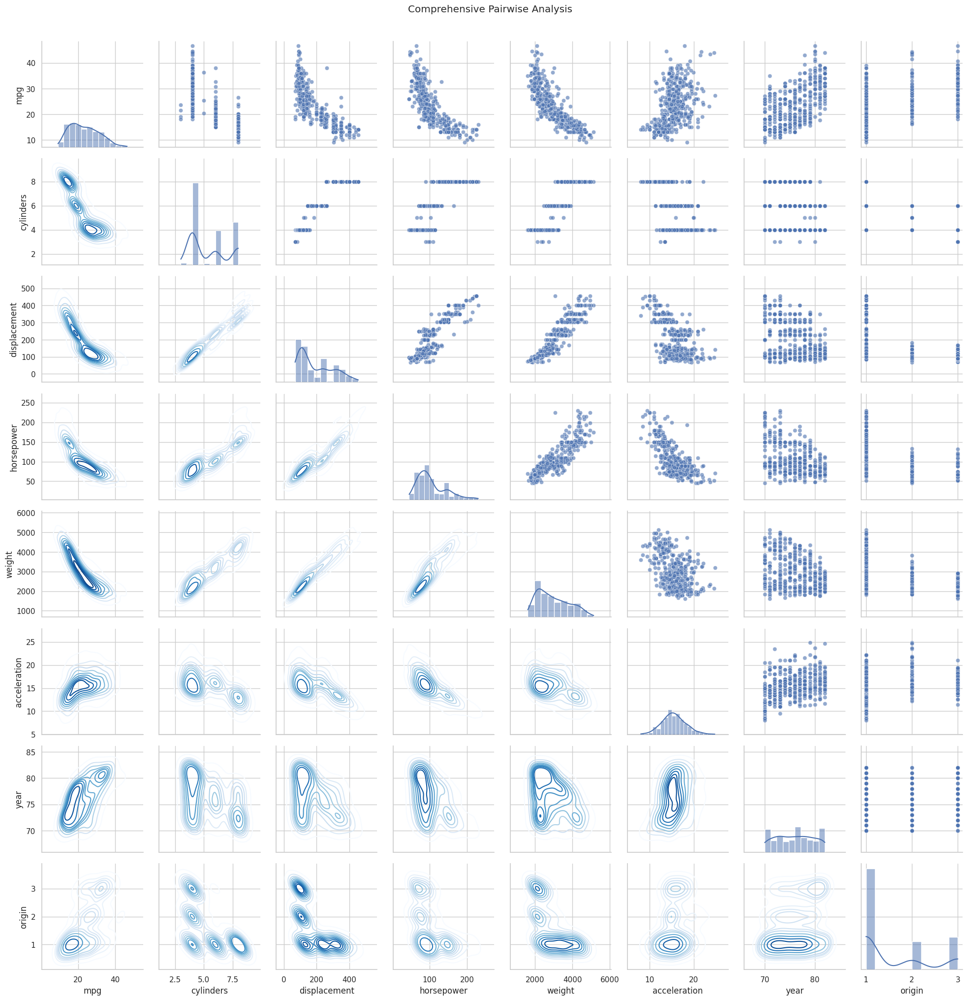

In [ ]:
# Multivariate analysis

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D
import warnings
warnings.filterwarnings('ignore')

# Load the dataset
df = pd.read_csv("Auto.csv")

def comprehensive_multivariate_analysis(df):
    """
    Comprehensive multivariate analysis with multiple correlation methods and visualizations
    """

    # Prepare numeric data
    numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    numeric_data = df[numeric_cols].copy()

    print("="*80)
    print("MULTIVARIATE ANALYSIS")
    print("="*80)
    print(f"Analyzing {len(numeric_cols)} numeric variables: {numeric_cols}")
    print(f"Dataset shape: {df.shape}")
    print("="*80)

    # 1. MULTIPLE CORRELATION MATRICES
    print("\n1. MULTIPLE CORRELATION MATRICES")
    print("-"*50)

    # Pearson correlation matrix
    pearson_corr = numeric_data.corr(method='pearson')
    print("\nPearson Correlation Matrix:")
    print(pearson_corr.round(4))

    # Spearman correlation matrix
    spearman_corr = numeric_data.corr(method='spearman')
    print("\nSpearman Correlation Matrix:")
    print(spearman_corr.round(4))

    # 2. ADVANCED CORRELATION VISUALIZATIONS
    print("\n\n2. ADVANCED CORRELATION VISUALIZATIONS")
    print("-"*50)

    # Multiple correlation heatmaps
    fig, axes = plt.subplots(2, 2, figsize=(20, 16))

    # Pearson heatmap
    sns.heatmap(pearson_corr, annot=True, cmap='RdBu_r', center=0,
                square=True, fmt='.3f', ax=axes[0,0])
    axes[0,0].set_title('Pearson Correlation Heatmap')

    # Spearman heatmap
    sns.heatmap(spearman_corr, annot=True, cmap='RdBu_r', center=0,
                square=True, fmt='.3f', ax=axes[0,1])
    axes[0,1].set_title('Spearman Correlation Heatmap')

    # Correlation difference (Pearson vs Spearman)
    corr_diff = pearson_corr - spearman_corr
    sns.heatmap(corr_diff, annot=True, cmap='RdYlBu', center=0,
                square=True, fmt='.3f', ax=axes[1,1])
    axes[1,1].set_title('Correlation Difference (Pearson - Spearman)')

    plt.tight_layout()
    plt.show()

    # 3. HIERARCHICAL CLUSTERING OF CORRELATIONS
    print("\n3. HIERARCHICAL CLUSTERING OF CORRELATIONS")
    print("-"*50)

    plt.figure(figsize=(12, 10))
    sns.clustermap(pearson_corr, annot=True, cmap='RdBu_r', center=0,
                   square=True, fmt='.3f', figsize=(12, 10))
    plt.title('Clustered Correlation Heatmap')
    plt.show()

    # 4. PAIRPLOT MATRIX - Comprehensive pairwise analysis
    print("\n4. COMPREHENSIVE PAIRPLOT ANALYSIS")
    print("-"*50)

    g = sns.PairGrid(numeric_data)
    g.map_upper(sns.scatterplot, alpha=0.6)
    g.map_lower(sns.kdeplot, cmap='Blues')
    g.map_diag(sns.histplot, kde=True)
    plt.suptitle('Comprehensive Pairwise Analysis', y=1.02)
    plt.show()

# Run comprehensive multivariate analysis
results = comprehensive_multivariate_analysis(df)

MULTIVARIATE ANALYSIS
Analyzing 8 numeric variables: ['mpg', 'cylinders', 'displacement', 'horsepower', 'weight', 'acceleration', 'year', 'origin']
Dataset shape: (392, 9)

1. MULTIPLE CORRELATION MATRICES
--------------------------------------------------

Pearson Correlation Matrix:
                 mpg  cylinders  displacement  horsepower  weight  \
mpg           1.0000    -0.7776       -0.8051     -0.7784 -0.8322   
cylinders    -0.7776     1.0000        0.9508      0.8430  0.8975   
displacement -0.8051     0.9508        1.0000      0.8973  0.9330   
horsepower   -0.7784     0.8430        0.8973      1.0000  0.8645   
weight       -0.8322     0.8975        0.9330      0.8645  1.0000   
acceleration  0.4233    -0.5047       -0.5438     -0.6892 -0.4168   
year          0.5805    -0.3456       -0.3699     -0.4164 -0.3091   
origin        0.5652    -0.5689       -0.6145     -0.4552 -0.5850   

              acceleration    year  origin  
mpg                 0.4233  0.5805  0.5652  
cy

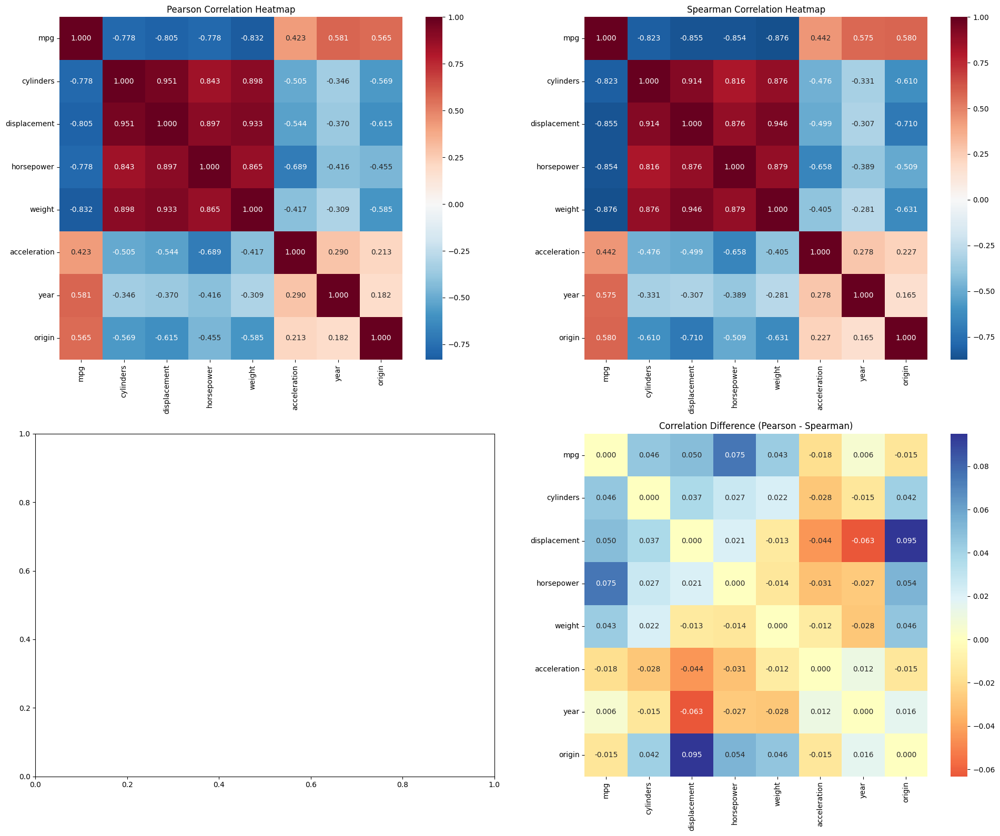


3. HIERARCHICAL CLUSTERING OF CORRELATIONS
--------------------------------------------------


<Figure size 1200x1000 with 0 Axes>

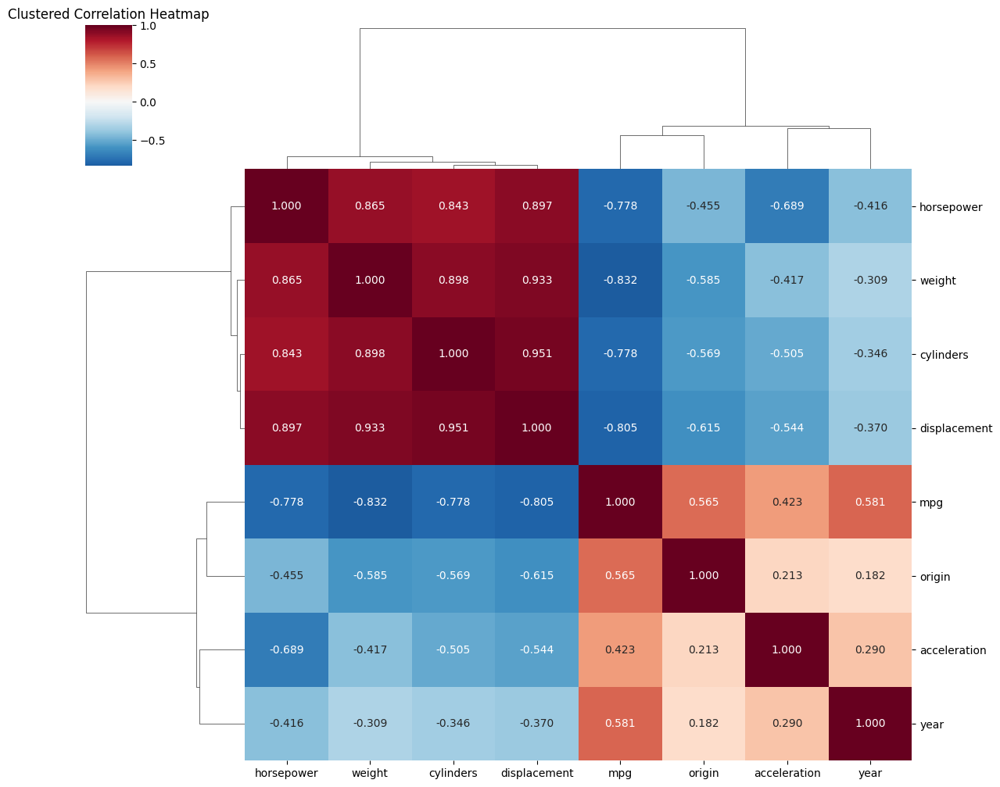


4. COMPREHENSIVE PAIRPLOT ANALYSIS
--------------------------------------------------


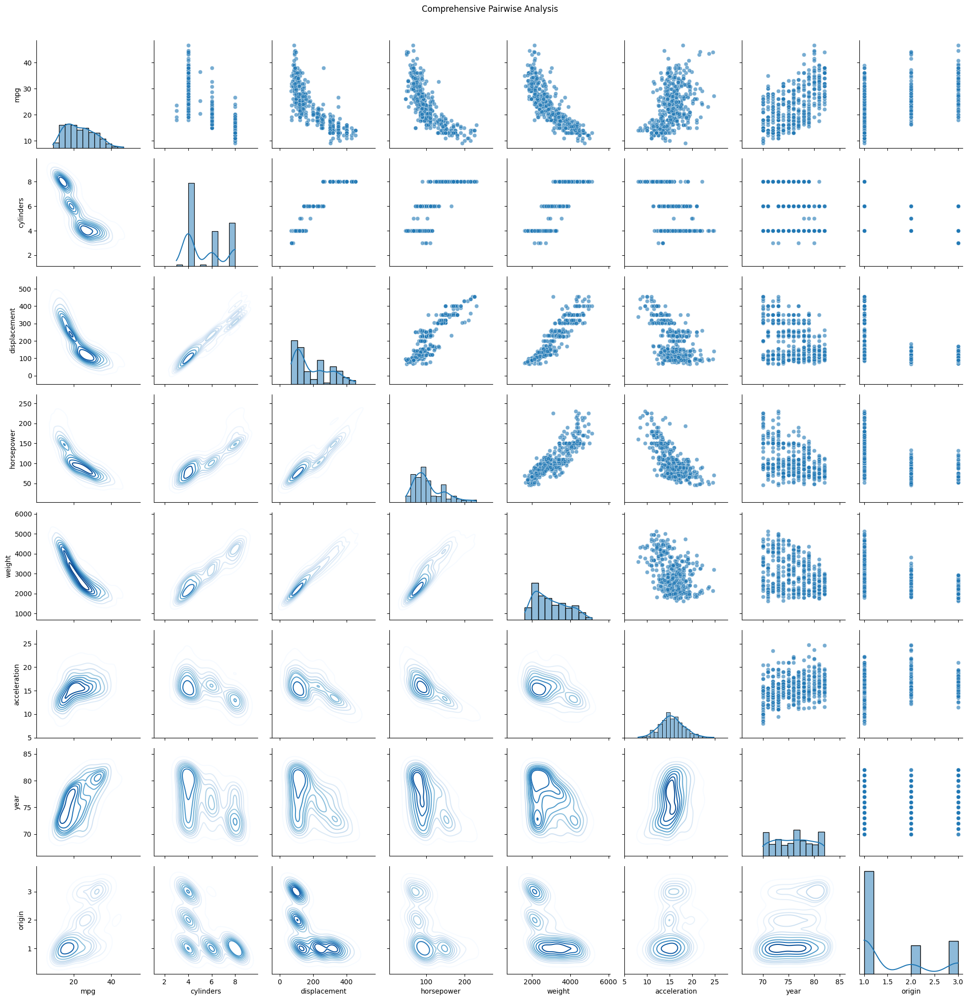


5. PRINCIPAL COMPONENT ANALYSIS (PCA)
--------------------------------------------------
Explained variance ratio: [0.672  0.118  0.1015 0.0608 0.0229 0.0143 0.0067 0.004 ]
Cumulative explained variance: [0.672  0.7899 0.8914 0.9522 0.975  0.9893 0.996  1.    ]


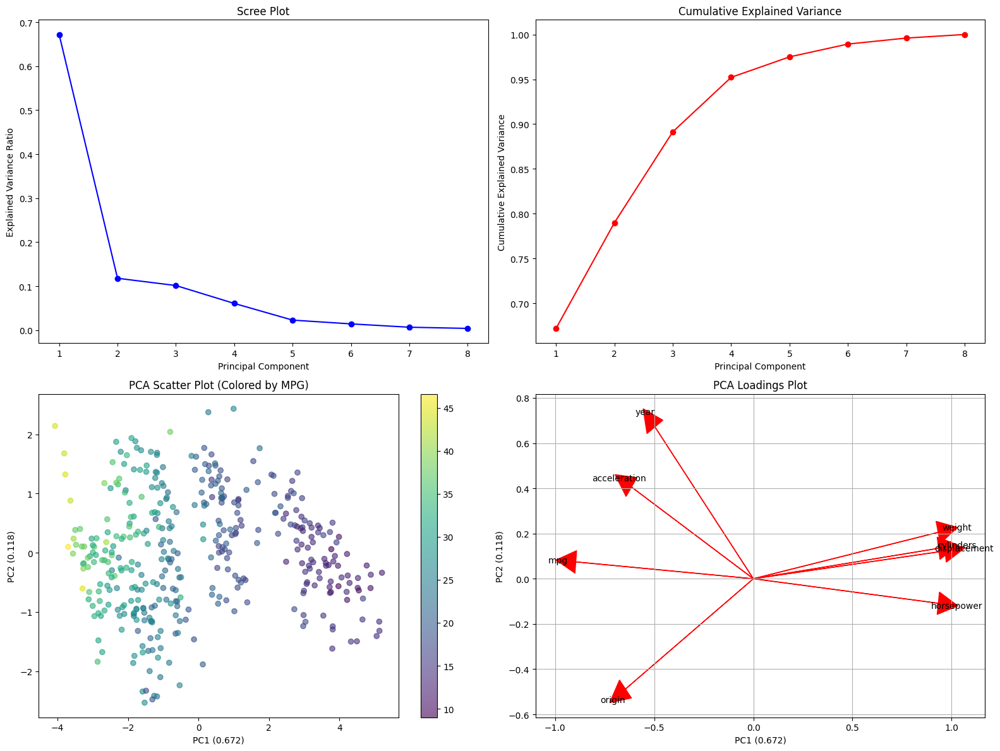


6. MULTIPLE CORRELATION COEFFICIENTS
--------------------------------------------------
Multiple Correlation Coefficients:
----------------------------------------
mpg            : R = 0.9064, R² = 0.8215
cylinders      : R = 0.9526, R² = 0.9074
displacement   : R = 0.9773, R² = 0.9550
horsepower     : R = 0.9486, R² = 0.8998
weight         : R = 0.9626, R² = 0.9265
acceleration   : R = 0.7873, R² = 0.6198
year           : R = 0.6977, R² = 0.4867
origin         : R = 0.6870, R² = 0.4719


7. ADVANCED MULTIVARIATE VISUALIZATIONS
--------------------------------------------------


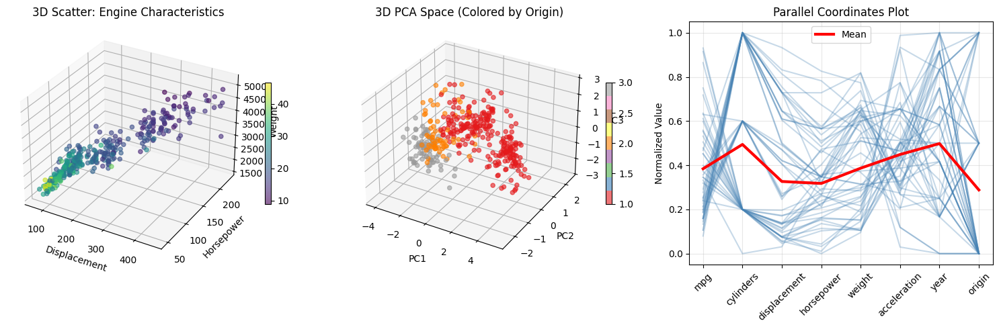


8. CLUSTERING ANALYSIS
--------------------------------------------------


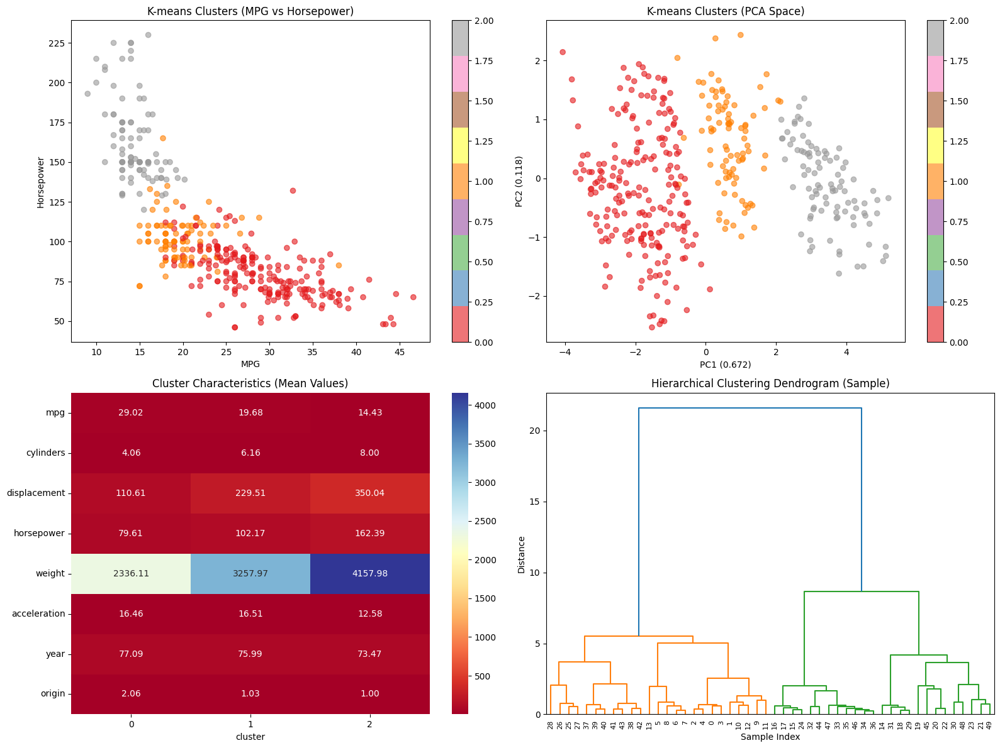


9. CORRELATION NETWORK ANALYSIS
--------------------------------------------------
Strong correlations (|r| > 0.5):
mpg             - cylinders      : -0.778
mpg             - displacement   : -0.805
mpg             - horsepower     : -0.778
mpg             - weight         : -0.832
mpg             - year           :  0.581
mpg             - origin         :  0.565
cylinders       - displacement   :  0.951
cylinders       - horsepower     :  0.843
cylinders       - weight         :  0.898
cylinders       - acceleration   : -0.505
cylinders       - origin         : -0.569
displacement    - horsepower     :  0.897
displacement    - weight         :  0.933
displacement    - acceleration   : -0.544
displacement    - origin         : -0.615
horsepower      - weight         :  0.865
horsepower      - acceleration   : -0.689
weight          - origin         : -0.585


10. COMPREHENSIVE SUMMARY TABLE
--------------------------------------------------

Comprehensive Multivariate Summary:
    V

In [1]:
# Multivariate analysis

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D
import warnings
warnings.filterwarnings('ignore')

# Load the dataset
df = pd.read_csv("Auto.csv")

def comprehensive_multivariate_analysis(df):
    """
    Comprehensive multivariate analysis with multiple correlation methods and visualizations
    """

    # Prepare numeric data
    numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    numeric_data = df[numeric_cols].copy()

    print("="*80)
    print("MULTIVARIATE ANALYSIS")
    print("="*80)
    print(f"Analyzing {len(numeric_cols)} numeric variables: {numeric_cols}")
    print(f"Dataset shape: {df.shape}")
    print("="*80)

    # 1. MULTIPLE CORRELATION MATRICES
    print("\n1. MULTIPLE CORRELATION MATRICES")
    print("-"*50)

    # Pearson correlation matrix
    pearson_corr = numeric_data.corr(method='pearson')
    print("\nPearson Correlation Matrix:")
    print(pearson_corr.round(4))

    # Spearman correlation matrix
    spearman_corr = numeric_data.corr(method='spearman')
    print("\nSpearman Correlation Matrix:")
    print(spearman_corr.round(4))

    # 2. ADVANCED CORRELATION VISUALIZATIONS
    print("\n\n2. ADVANCED CORRELATION VISUALIZATIONS")
    print("-"*50)

    # Multiple correlation heatmaps
    fig, axes = plt.subplots(2, 2, figsize=(20, 16))

    # Pearson heatmap
    sns.heatmap(pearson_corr, annot=True, cmap='RdBu_r', center=0,
                square=True, fmt='.3f', ax=axes[0,0])
    axes[0,0].set_title('Pearson Correlation Heatmap')

    # Spearman heatmap
    sns.heatmap(spearman_corr, annot=True, cmap='RdBu_r', center=0,
                square=True, fmt='.3f', ax=axes[0,1])
    axes[0,1].set_title('Spearman Correlation Heatmap')

    # Correlation difference (Pearson vs Spearman)
    corr_diff = pearson_corr - spearman_corr
    sns.heatmap(corr_diff, annot=True, cmap='RdYlBu', center=0,
                square=True, fmt='.3f', ax=axes[1,1])
    axes[1,1].set_title('Correlation Difference (Pearson - Spearman)')

    plt.tight_layout()
    plt.show()

    # 3. HIERARCHICAL CLUSTERING OF CORRELATIONS
    print("\n3. HIERARCHICAL CLUSTERING OF CORRELATIONS")
    print("-"*50)

    plt.figure(figsize=(12, 10))
    sns.clustermap(pearson_corr, annot=True, cmap='RdBu_r', center=0,
                   square=True, fmt='.3f', figsize=(12, 10))
    plt.title('Clustered Correlation Heatmap')
    plt.show()

    # 4. PAIRPLOT MATRIX - Comprehensive pairwise analysis
    print("\n4. COMPREHENSIVE PAIRPLOT ANALYSIS")
    print("-"*50)

    g = sns.PairGrid(numeric_data)
    g.map_upper(sns.scatterplot, alpha=0.6)
    g.map_lower(sns.kdeplot, cmap='Blues')
    g.map_diag(sns.histplot, kde=True)
    plt.suptitle('Comprehensive Pairwise Analysis', y=1.02)
    plt.show()

    # 5. PRINCIPAL COMPONENT ANALYSIS (PCA)
    print("\n5. PRINCIPAL COMPONENT ANALYSIS (PCA)")
    print("-"*50)

    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(numeric_data)

    pca = PCA()
    pca_result = pca.fit_transform(scaled_data)

    print(f"Explained variance ratio: {pca.explained_variance_ratio_.round(4)}")
    print(f"Cumulative explained variance: {pca.explained_variance_ratio_.cumsum().round(4)}")

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    # Scree plot
    axes[0,0].plot(range(1, len(pca.explained_variance_ratio_) + 1),
                   pca.explained_variance_ratio_, 'bo-')
    axes[0,0].set_xlabel('Principal Component')
    axes[0,0].set_ylabel('Explained Variance Ratio')
    axes[0,0].set_title('Scree Plot')

    # Cumulative explained variance
    axes[0,1].plot(range(1, len(pca.explained_variance_ratio_) + 1),
                   pca.explained_variance_ratio_.cumsum(), 'ro-')
    axes[0,1].set_xlabel('Principal Component')
    axes[0,1].set_ylabel('Cumulative Explained Variance')
    axes[0,1].set_title('Cumulative Explained Variance')

    # PCA scatter plot (PC1 vs PC2)
    scatter = axes[1,0].scatter(pca_result[:, 0], pca_result[:, 1],
                               c=df['mpg'], cmap='viridis', alpha=0.6)
    axes[1,0].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.3f})')
    axes[1,0].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.3f})')
    axes[1,0].set_title('PCA Scatter Plot (Colored by MPG)')
    plt.colorbar(scatter, ax=axes[1,0])

    # PCA loadings plot
    loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
    for i, var in enumerate(numeric_cols):
        axes[1,1].arrow(0, 0, loadings[i, 0], loadings[i, 1],
                       head_width=0.1, head_length=0.1, fc='red', ec='red')
        axes[1,1].text(loadings[i, 0] * 1.1, loadings[i, 1] * 1.1, var,
                      fontsize=10, ha='center', va='center')
    axes[1,1].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.3f})')
    axes[1,1].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.3f})')
    axes[1,1].set_title('PCA Loadings Plot')
    axes[1,1].grid(True)

    plt.tight_layout()
    plt.show()

    # 6. MULTIPLE CORRELATION COEFFICIENTS
    print("\n6. MULTIPLE CORRELATION COEFFICIENTS")
    print("-"*50)

    multiple_corr_results = {}
    for target_var in numeric_cols:
        X = numeric_data.drop(columns=[target_var])
        y = numeric_data[target_var]
        corr_matrix = numeric_data.corr()
        try:
            r_vec = corr_matrix.loc[X.columns, target_var].values
            R_matrix = corr_matrix.loc[X.columns, X.columns].values
            R_squared = r_vec.T @ np.linalg.inv(R_matrix) @ r_vec
            R_multiple = np.sqrt(max(0, min(1, R_squared)))
            multiple_corr_results[target_var] = {
                'R_multiple': R_multiple,
                'R_squared': R_squared
            }
        except np.linalg.LinAlgError:
            multiple_corr_results[target_var] = {
                'R_multiple': np.nan,
                'R_squared': np.nan
            }

    print("Multiple Correlation Coefficients:")
    print("-" * 40)
    for var, results in multiple_corr_results.items():
        print(f"{var:15s}: R = {results['R_multiple']:.4f}, R² = {results['R_squared']:.4f}")

    # 7. ADVANCED MULTIVARIATE VISUALIZATIONS
    print("\n\n7. ADVANCED MULTIVARIATE VISUALIZATIONS")
    print("-"*50)

    fig = plt.figure(figsize=(15, 5))

    # 3D scatter plot 1
    ax1 = fig.add_subplot(131, projection='3d')
    scatter1 = ax1.scatter(df['displacement'], df['horsepower'], df['weight'],
                          c=df['mpg'], cmap='viridis', alpha=0.6)
    ax1.set_xlabel('Displacement')
    ax1.set_ylabel('Horsepower')
    ax1.set_zlabel('Weight')
    ax1.set_title('3D Scatter: Engine Characteristics')
    plt.colorbar(scatter1, ax=ax1, shrink=0.5)

    # 3D scatter plot 2
    ax2 = fig.add_subplot(132, projection='3d')
    scatter2 = ax2.scatter(pca_result[:, 0], pca_result[:, 1], pca_result[:, 2],
                          c=df['origin'], cmap='Set1', alpha=0.6)
    ax2.set_xlabel('PC1')
    ax2.set_ylabel('PC2')
    ax2.set_zlabel('PC3')
    ax2.set_title('3D PCA Space (Colored by Origin)')
    plt.colorbar(scatter2, ax=ax2, shrink=0.5)

    # Parallel coordinates plot
    ax3 = fig.add_subplot(133)
    norm_data = (numeric_data - numeric_data.min()) / (numeric_data.max() - numeric_data.min())
    sample_idx = np.random.choice(len(norm_data), 50, replace=False)
    for i in sample_idx:
        ax3.plot(range(len(numeric_cols)), norm_data.iloc[i],
                alpha=0.3, color='steelblue')
    ax3.plot(range(len(numeric_cols)), norm_data.mean(),
             color='red', linewidth=3, label='Mean')
    ax3.set_xticks(range(len(numeric_cols)))
    ax3.set_xticklabels(numeric_cols, rotation=45)
    ax3.set_ylabel('Normalized Value')
    ax3.set_title('Parallel Coordinates Plot')
    ax3.legend()
    ax3.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # 8. CLUSTERING ANALYSIS
    print("\n8. CLUSTERING ANALYSIS")
    print("-"*50)

    kmeans = KMeans(n_clusters=3, random_state=42)
    clusters = kmeans.fit_predict(scaled_data)

    df_clustered = df.copy()
    df_clustered['cluster'] = clusters

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    scatter = axes[0,0].scatter(df['mpg'], df['horsepower'],
                               c=clusters, cmap='Set1', alpha=0.6)
    axes[0,0].set_xlabel('MPG')
    axes[0,0].set_ylabel('Horsepower')
    axes[0,0].set_title('K-means Clusters (MPG vs Horsepower)')
    plt.colorbar(scatter, ax=axes[0,0])

    scatter = axes[0,1].scatter(pca_result[:, 0], pca_result[:, 1],
                               c=clusters, cmap='Set1', alpha=0.6)
    axes[0,1].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.3f})')
    axes[0,1].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.3f})')
    axes[0,1].set_title('K-means Clusters (PCA Space)')
    plt.colorbar(scatter, ax=axes[0,1])

    cluster_stats = df_clustered.groupby('cluster')[numeric_cols].mean()
    sns.heatmap(cluster_stats.T, annot=True, cmap='RdYlBu',
                ax=axes[1,0], fmt='.2f')
    axes[1,0].set_title('Cluster Characteristics (Mean Values)')

    linkage_matrix = linkage(scaled_data[:50], method='ward')
    dendrogram(linkage_matrix, ax=axes[1,1])
    axes[1,1].set_title('Hierarchical Clustering Dendrogram (Sample)')
    axes[1,1].set_xlabel('Sample Index')
    axes[1,1].set_ylabel('Distance')

    plt.tight_layout()
    plt.show()

    # 9. CORRELATION NETWORK ANALYSIS
    print("\n9. CORRELATION NETWORK ANALYSIS")
    print("-"*50)

    threshold = 0.5
    strong_corr = pearson_corr.abs() > threshold

    print(f"Strong correlations (|r| > {threshold}):")
    for i, var1 in enumerate(numeric_cols):
        for j, var2 in enumerate(numeric_cols):
            if i < j and strong_corr.iloc[i, j]:
                corr_val = pearson_corr.iloc[i, j]
                print(f"{var1:15s} - {var2:15s}: {corr_val:6.3f}")

    # 10. SUMMARY STATISTICS TABLE
    print("\n\n10. COMPREHENSIVE SUMMARY TABLE")
    print("-"*50)

    summary_stats = pd.DataFrame({
        'Variable': numeric_cols,
        'Mean': numeric_data.mean().round(3),
        'Std': numeric_data.std().round(3),
        'Min': numeric_data.min().round(3),
        'Max': numeric_data.max().round(3),
        'Multiple_R': [multiple_corr_results[var]['R_multiple'] for var in numeric_cols],
        'Multiple_R_squared': [multiple_corr_results[var]['R_squared'] for var in numeric_cols],
        'PC1_Loading': np.abs(pca.components_[0]).round(3),
        'PC2_Loading': np.abs(pca.components_[1]).round(3)
    })

    print("\nComprehensive Multivariate Summary:")
    print(summary_stats.to_string(index=False))

    return {
        'correlation_matrices': {
            'pearson': pearson_corr,
            'spearman': spearman_corr,
        },
        'pca_results': {
            'explained_variance_ratio': pca.explained_variance_ratio_,
            'components': pca.components_,
            'transformed_data': pca_result
        },
        'multiple_correlations': multiple_corr_results,
        'clusters': clusters,
        'summary_stats': summary_stats
    }

# Run comprehensive multivariate analysis
results = comprehensive_multivariate_analysis(df)

DatetimeIndex(['1970-01-01', '1970-01-01', '1970-01-01', '1970-01-01',
               '1970-01-01', '1970-01-01', '1970-01-01', '1970-01-01',
               '1970-01-01', '1970-01-01',
               ...
               '1982-01-01', '1982-01-01', '1982-01-01', '1982-01-01',
               '1982-01-01', '1982-01-01', '1982-01-01', '1982-01-01',
               '1982-01-01', '1982-01-01'],
              dtype='datetime64[ns]', name='year', length=392, freq=None)
year
1970    17.689655
1971    21.111111
1972    18.714286
1973    17.100000
1974    22.769231
1975    20.266667
1976    21.573529
1977    23.375000
1978    24.061111
1979    25.093103
1980    33.803704
1981    30.185714
1982    32.000000
Name: mpg, dtype: float64


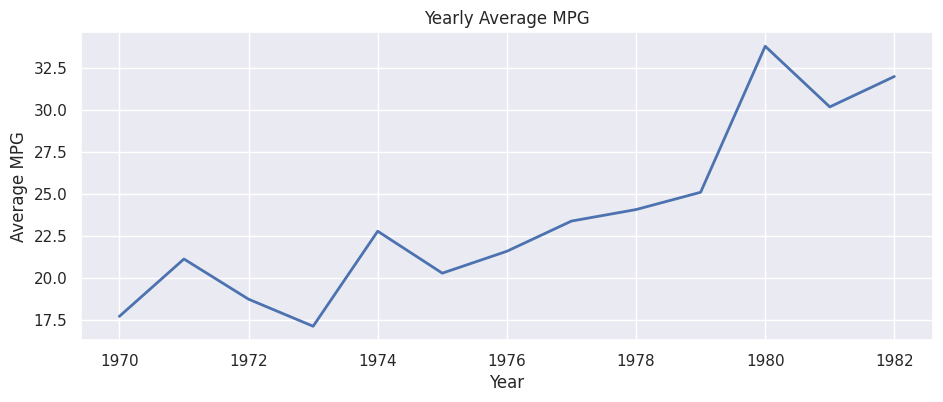

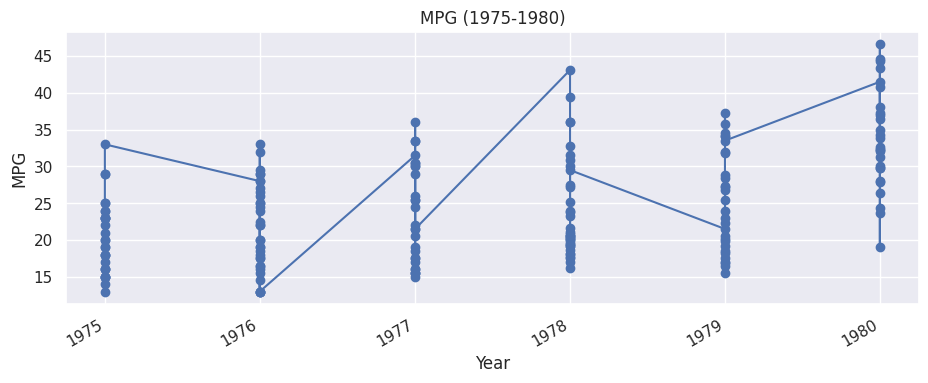

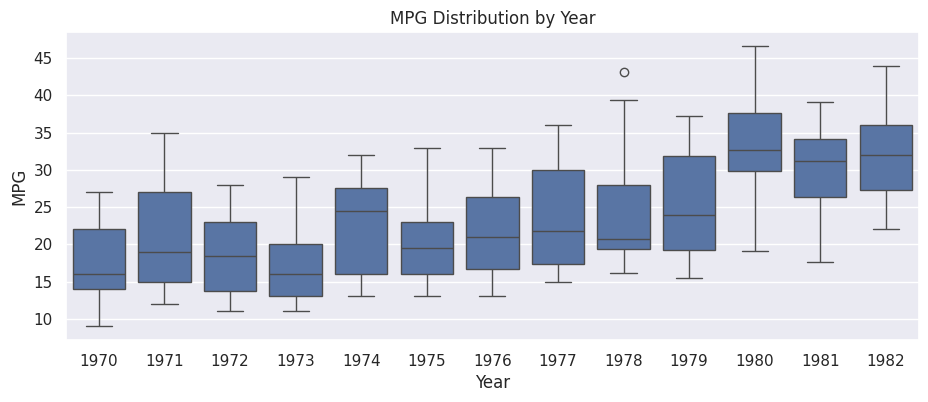

/tmp/ipython-input-1947469036.py:50: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_auto['mpg'].resample('Y').mean().plot(marker='*', linestyle='-')


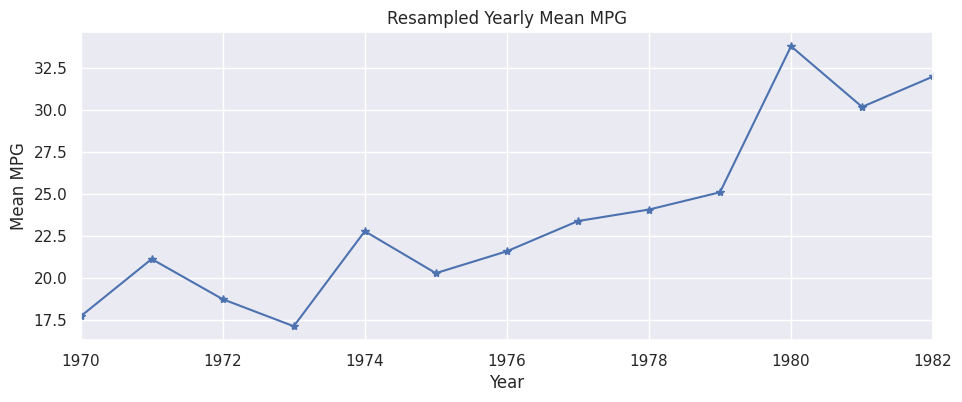

In [ ]:
# Time series analysis

import pandas as pd

# 1. Load dataset
df_auto = pd.read_csv("Auto.csv")

# 2. Convert the 'year' column to datetime and set it as the DataFrame index for time-based operations
df_auto['year'] = pd.to_datetime(df_auto['year'], format='%y')
df_auto = df_auto.set_index('year')
print(df_auto.index)

# 3. Group by year and calculate mean mpg for each year
df_yearly = df_auto.groupby(df_auto.index.year)['mpg'].mean()
print(df_yearly)

import matplotlib.pyplot as plt
import seaborn as sns

# 4. Set Seaborn figure size for all plots
sns.set(rc={'figure.figsize':(11, 4)})

# 5. Plot yearly average mpg using a line plot
df_yearly.plot(linewidth=2)
plt.title('Yearly Average MPG')
plt.xlabel('Year')
plt.ylabel('Average MPG')
plt.show()

# 6. Plot MPG for a specific year range (1975 to 1980)
df_auto.loc['1975':'1980', 'mpg'].plot(marker='o', linestyle='-')
plt.title('MPG (1975-1980)')
plt.xlabel('Year')
plt.ylabel('MPG')
plt.show()

# 7. Add a column for the numeric year (useful for groupings and boxplot axes)
df_auto['year_num'] = df_auto.index.year

# 8. Create a boxplot to show distribution of MPG by year
sns.boxplot(data=df_auto, x='year_num', y='mpg')
plt.title('MPG Distribution by Year')
plt.xlabel('Year')
plt.ylabel('MPG')
plt.show()

# 9. If there are multiple entries per year, resample by year and plot the yearly mean MPG using resample
df_auto['mpg'].resample('Y').mean().plot(marker='*', linestyle='-')
plt.title('Resampled Yearly Mean MPG')
plt.xlabel('Year')
plt.ylabel('Mean MPG')
plt.show()


    mpg  cylinders  displacement  horsepower  weight  acceleration  year  \
0  18.0          8         307.0         130    3504          12.0    70   
1  15.0          8         350.0         165    3693          11.5    70   
2  18.0          8         318.0         150    3436          11.0    70   
3  16.0          8         304.0         150    3433          12.0    70   
4  17.0          8         302.0         140    3449          10.5    70   

   origin                       name  
0       1  chevrolet chevelle malibu  
1       1          buick skylark 320  
2       1         plymouth satellite  
3       1              amc rebel sst  
4       1                ford torino  

Summary Statistics
               mpg   cylinders  displacement  horsepower       weight  \
count   392.000000  392.000000    392.000000  392.000000   392.000000   
unique         NaN         NaN           NaN         NaN          NaN   
top            NaN         NaN           NaN         NaN          NaN 

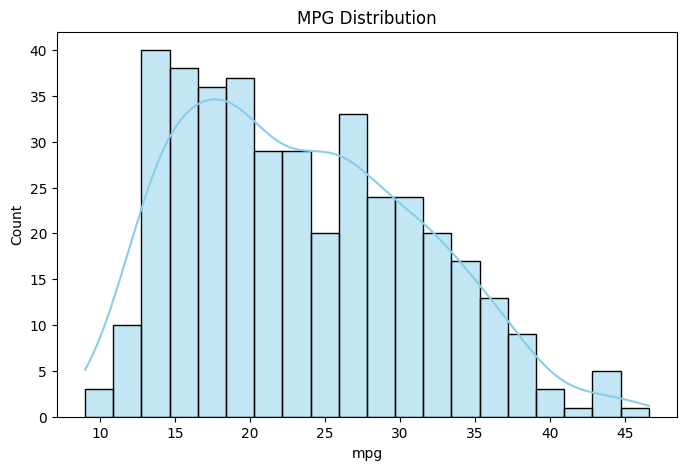


Skewness of numeric features
mpg: 0.455
cylinders: 0.506
displacement: 0.699
horsepower: 1.083
weight: 0.518
acceleration: 0.290
year: 0.020
origin: 0.912

Quantiles for mpg
0.25    17.00
0.50    22.75
0.75    29.00
Name: mpg, dtype: float64

Frequency Distribution (cylinders)
cylinders
4    199
8    103
6     83
3      4
5      3
Name: count, dtype: int64


/tmp/ipython-input-2297708728.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x="cylinders", data=df, palette="Set2")


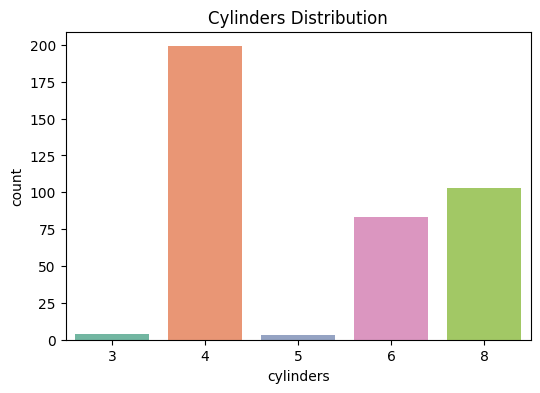

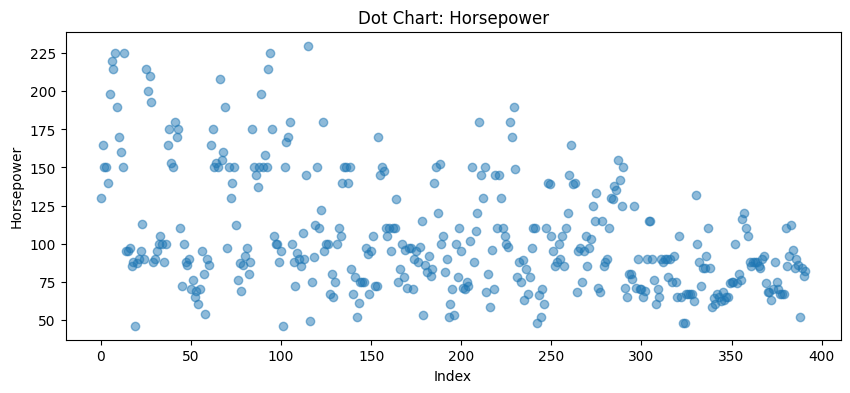

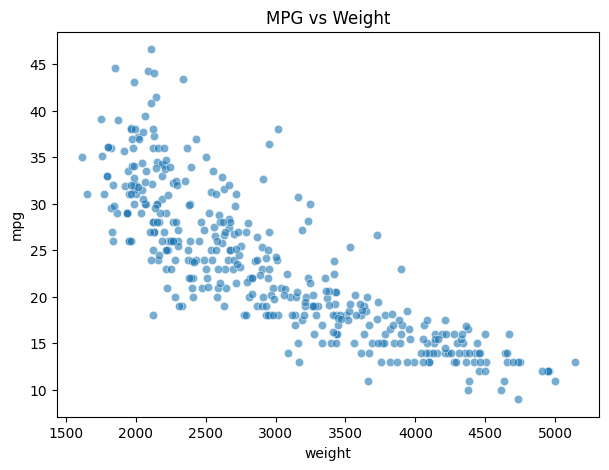

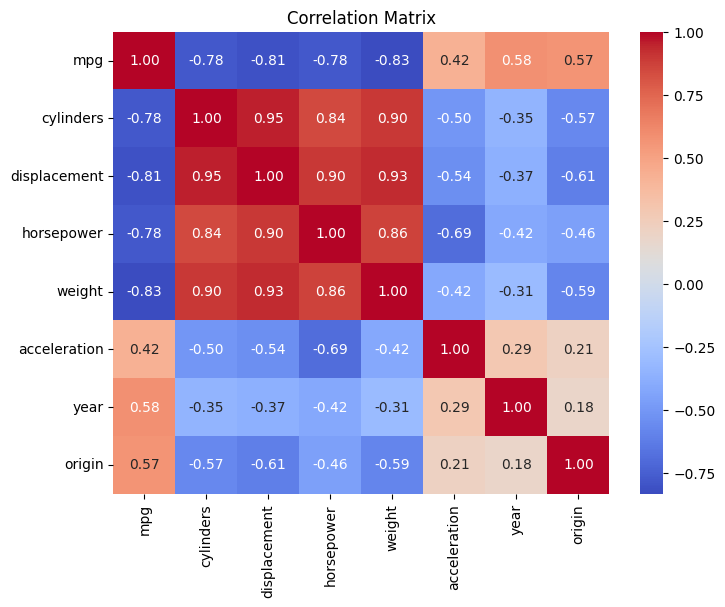

/tmp/ipython-input-2297708728.py:76: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="cylinders", y="mpg", data=df, palette="Set3")


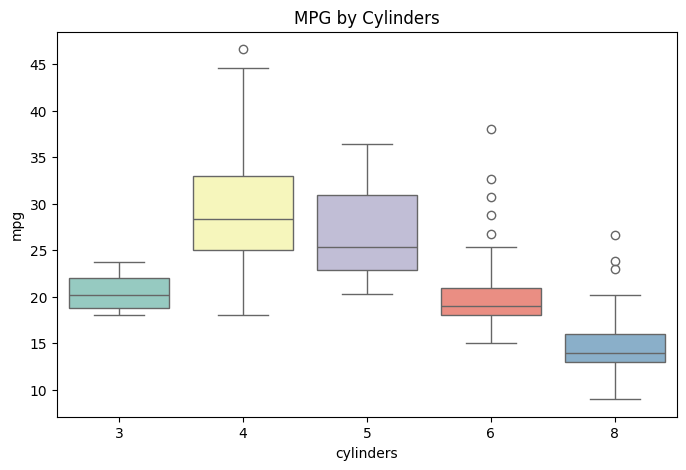


Contingency Table: Cylinders vs Origin
origin       1   2   3
cylinders             
3            0   0   4
4           69  61  69
5            0   3   0
6           73   4   6
8          103   0   0


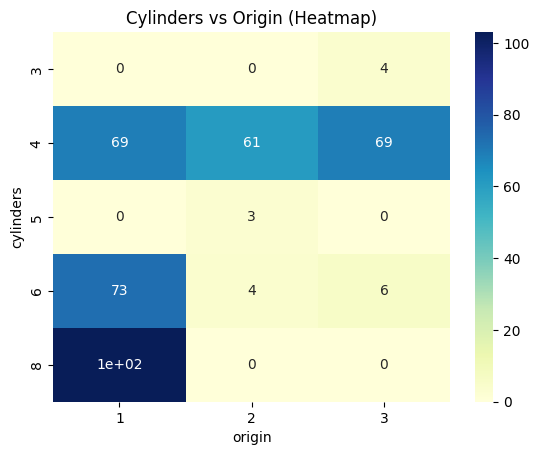

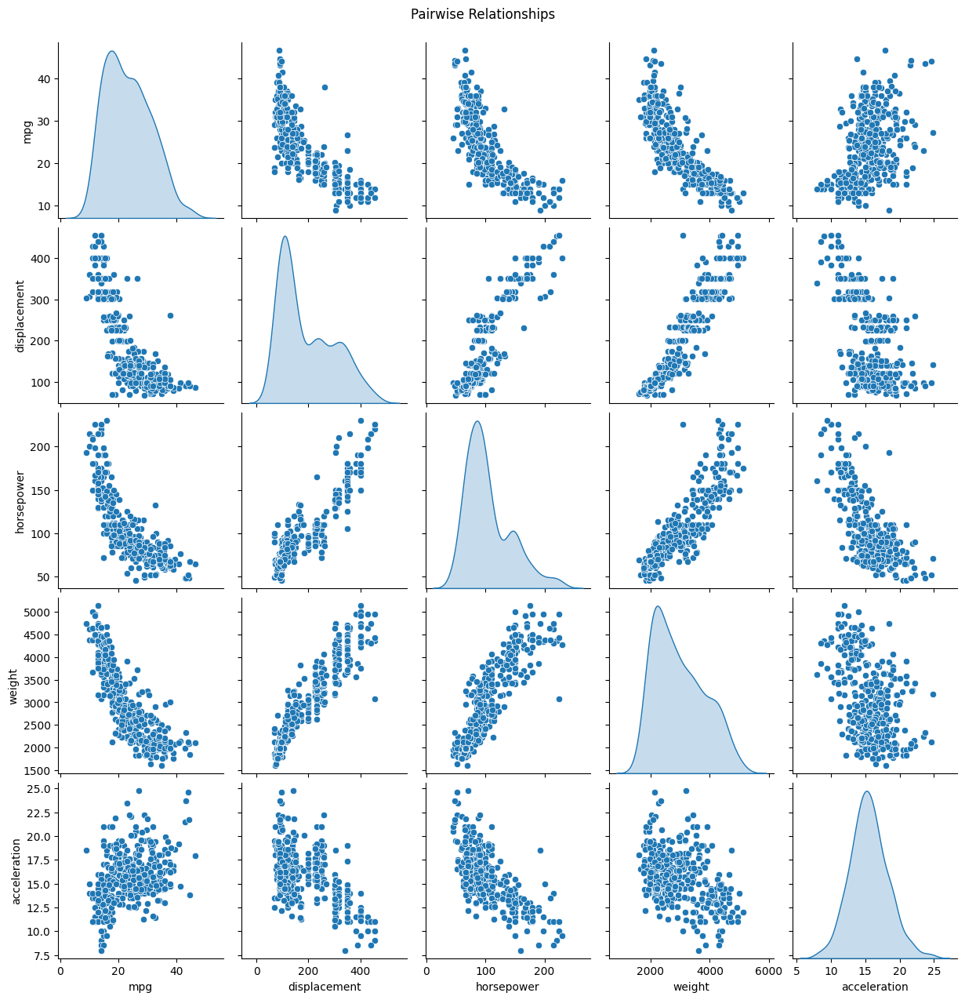

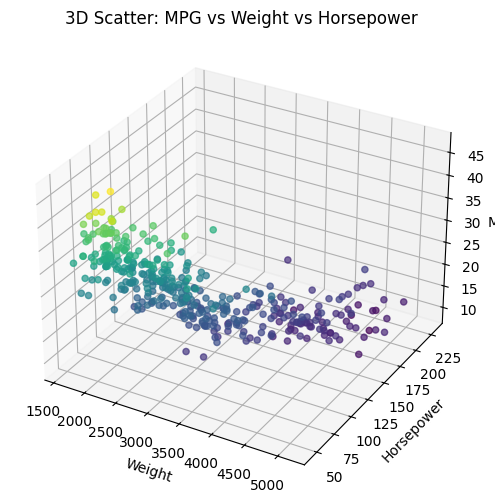

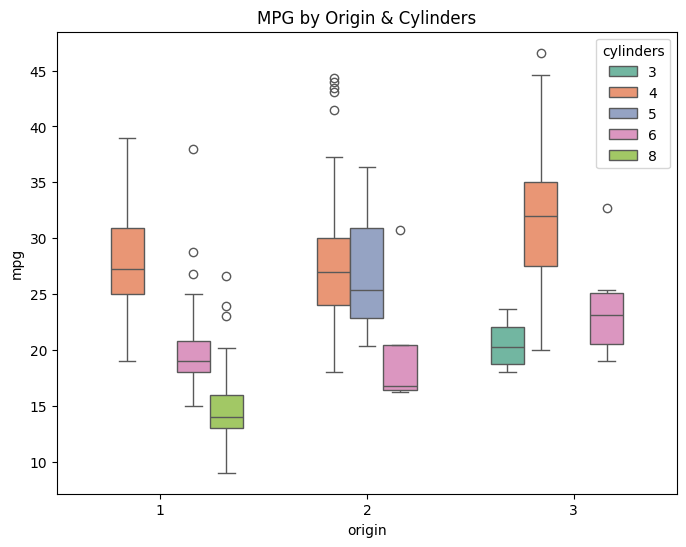

In [ ]:
# Statistical analysis

# Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew

# Load Data
df = pd.read_csv("Auto.csv")
print(df.head())

# Statistical Summary Measures
print("\nSummary Statistics")
print(df.describe(include="all"))

print("\nData Types")
print(df.dtypes)

print("\nMissing Values")
print(df.isnull().sum())

# 1D Analysis

# Distribution of mpg
plt.figure(figsize=(8,5))
sns.histplot(df["mpg"], kde=True, bins=20, color="skyblue")
plt.title("MPG Distribution")
plt.show()

# Skewness
print("\nSkewness of numeric features")
for col in df.select_dtypes(include=[np.number]).columns:
    print(f"{col}: {skew(df[col].dropna()):.3f}")

# Quantiles
print("\nQuantiles for mpg")
print(df["mpg"].quantile([0.25, 0.5, 0.75]))

# Frequency Distribution (categorical: cylinders)
print("\nFrequency Distribution (cylinders)")
print(df["cylinders"].value_counts())

# Bar Plot for categorical variable
plt.figure(figsize=(6,4))
sns.countplot(x="cylinders", data=df, palette="Set2")
plt.title("Cylinders Distribution")
plt.show()

# Dot Chart (Horsepower vs index)
plt.figure(figsize=(10,4))
plt.plot(df.index, df["horsepower"], 'o', alpha=0.5)
plt.title("Dot Chart: Horsepower")
plt.xlabel("Index")
plt.ylabel("Horsepower")
plt.show()

# 2D Analysis

# Numerical vs Numerical: Scatter plot mpg vs weight
plt.figure(figsize=(7,5))
sns.scatterplot(x="weight", y="mpg", data=df, alpha=0.6)
plt.title("MPG vs Weight")
plt.show()

# Correlation heatmap
plt.figure(figsize=(8,6))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix")
plt.show()

# Numerical vs Categorical: mpg by cylinders
plt.figure(figsize=(8,5))
sns.boxplot(x="cylinders", y="mpg", data=df, palette="Set3")
plt.title("MPG by Cylinders")
plt.show()

# Categorical vs Categorical: contingency table (cylinders vs origin)
print("\nContingency Table: Cylinders vs Origin")
print(pd.crosstab(df["cylinders"], df["origin"]))

sns.heatmap(pd.crosstab(df["cylinders"], df["origin"]), annot=True, cmap="YlGnBu")
plt.title("Cylinders vs Origin (Heatmap)")
plt.show()

# 3D / nD Analysis
# Pairplot (nD exploration for subset)
sns.pairplot(df[["mpg","displacement","horsepower","weight","acceleration"]], diag_kind="kde")
plt.suptitle("Pairwise Relationships", y=1.02)
plt.show()

# 3D Scatter Plot (mpg, weight, horsepower)
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(df["weight"], df["horsepower"], df["mpg"], c=df["mpg"], cmap="viridis", alpha=0.7)
ax.set_xlabel("Weight")
ax.set_ylabel("Horsepower")
ax.set_zlabel("MPG")
plt.title("3D Scatter: MPG vs Weight vs Horsepower")
plt.show()

# 3D Box Plot: MPG grouped by origin and cylinders
plt.figure(figsize=(8,6))
sns.boxplot(x="origin", y="mpg", hue="cylinders", data=df, palette="Set2")
plt.title("MPG by Origin & Cylinders")
plt.show()


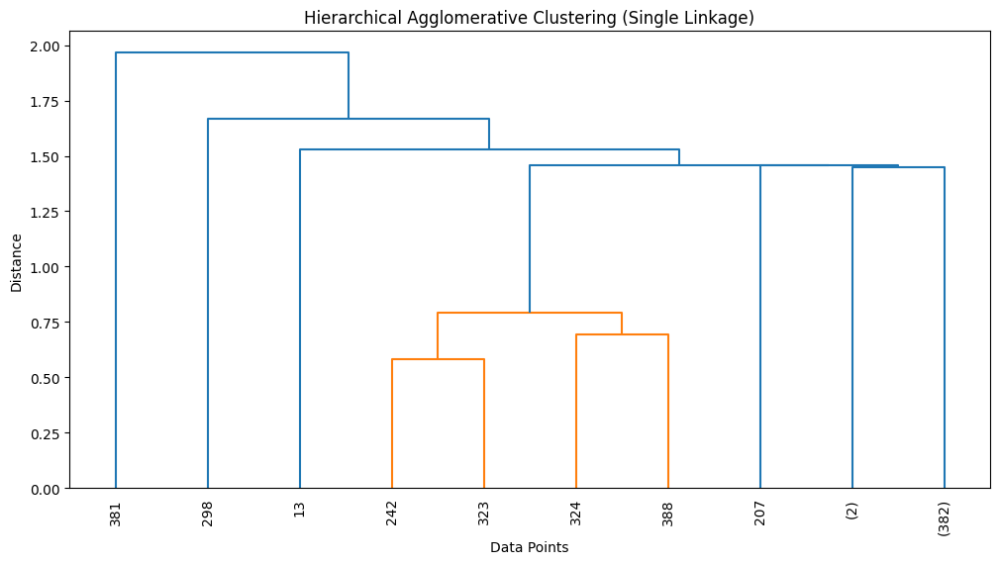


Cluster Assignments (first 10 rows)
    mpg  cylinders  displacement  horsepower  weight  Cluster
0  18.0          8         307.0         130    3504        1
1  15.0          8         350.0         165    3693        1
2  18.0          8         318.0         150    3436        1
3  16.0          8         304.0         150    3433        1
4  17.0          8         302.0         140    3449        1
5  15.0          8         429.0         198    4341        1
6  14.0          8         454.0         220    4354        1
7  14.0          8         440.0         215    4312        1
8  14.0          8         455.0         225    4425        1
9  15.0          8         390.0         190    3850        1


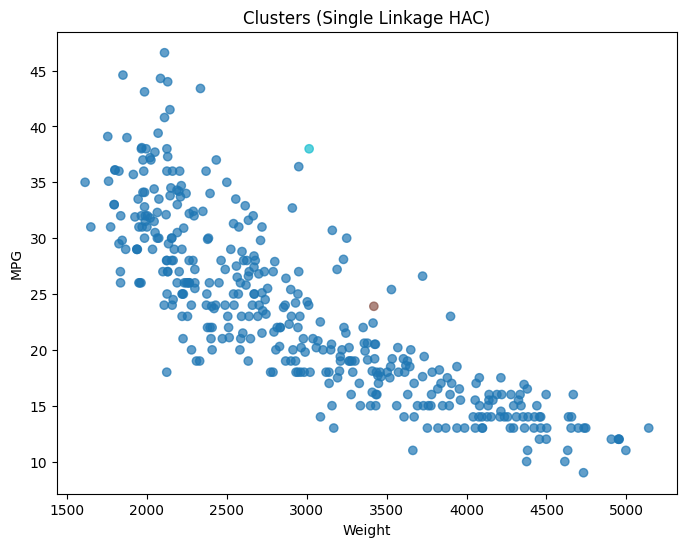

In [ ]:
# Hierarchical agglomerative model based clustering (Single linkage)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

# Load dataset
df = pd.read_csv("Auto.csv")

# Select only numeric features for clustering
num_df = df.select_dtypes(include=[np.number]).dropna()

# Standardize data (important for clustering)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(num_df)

# Perform hierarchical clustering with single linkage
Z = linkage(X_scaled, method="single")

# Dendrogram
plt.figure(figsize=(12,6))
dendrogram(Z, truncate_mode="level", p=5, leaf_rotation=90., leaf_font_size=10.)
plt.title("Hierarchical Agglomerative Clustering (Single Linkage)")
plt.xlabel("Data Points")
plt.ylabel("Distance")
plt.show()

# Decide number of clusters (example: 3)
clusters = fcluster(Z, t=3, criterion="maxclust")

# Add cluster labels back to dataframe
df["Cluster"] = clusters

print("\nCluster Assignments (first 10 rows)")
print(df[["mpg", "cylinders", "displacement", "horsepower", "weight", "Cluster"]].head(10))

# Visualize clusters in 2D (mpg vs weight)
plt.figure(figsize=(8,6))
plt.scatter(df["weight"], df["mpg"], c=df["Cluster"], cmap="tab10", alpha=0.7)
plt.xlabel("Weight")
plt.ylabel("MPG")
plt.title("Clusters (Single Linkage HAC)")
plt.show()


Original data (first 5 rows):
 [[18.  12. ]
 [15.  11.5]
 [18.  11. ]
 [16.  12. ]
 [17.  10.5]]

Mean vector: [23.446 15.541]

Centered data (first 5 rows):
 [[-5.446 -3.541]
 [-8.446 -4.041]
 [-5.446 -4.541]
 [-7.446 -3.541]
 [-6.446 -5.041]]

Covariance matrix:
 [[60.918  9.116]
 [ 9.116  7.611]]

Unsorted Eigenvalues: [62.4338  6.0957]
Unsorted Eigenvectors:
 [[ 0.9865 -0.164 ]
 [ 0.164   0.9865]]

Sorted Eigenvalues: [62.4338  6.0957]
Corresponding Eigenvectors:
 [[ 0.9865 -0.164 ]
 [ 0.164   0.9865]]

Explained Variance Ratio:
PC1: 0.9111
PC2: 0.0889

Projected data (first 5 samples):
 [[-5.953 -2.6  ]
 [-8.994 -2.601]
 [-6.117 -3.587]
 [-7.926 -2.272]
 [-7.186 -3.916]]


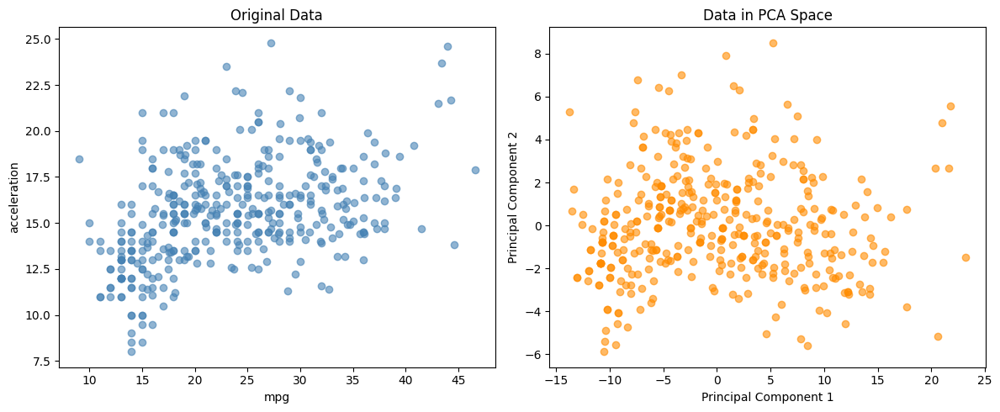

In [ ]:
# Principal Component Analysis

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load dataset
df = pd.read_csv("Auto.csv")

# Select 2 numeric attributes
features = ['mpg', 'acceleration']
X = df[features].dropna().values

print("Original data (first 5 rows):\n", np.round(X[:5], 3))

# Computing mean
mean_vector = np.mean(X, axis=0)
print("\nMean vector:", np.round(mean_vector, 3))

# Centering data
X_centered = X - mean_vector
print("\nCentered data (first 5 rows):\n", np.round(X_centered[:5], 3))

# Computing Covariance Matrix
# Formula: Cov(X) = (1/(n-1)) * (X_centered^T · X_centered)
n_samples = X_centered.shape[0]
cov_matrix = (1 / (n_samples - 1)) * np.dot(X_centered.T, X_centered)
print("\nCovariance matrix:\n", np.round(cov_matrix, 3))

# Computing Eigenvalues and Eigenvectors
eig_values, eig_vectors = np.linalg.eig(cov_matrix)

print("\nUnsorted Eigenvalues:", np.round(eig_values, 4))
print("Unsorted Eigenvectors:\n", np.round(eig_vectors, 4))

# Sort Eigenvalues (Descending) and Reorder Eigenvectors
idx = np.argsort(eig_values)[::-1]
eig_values = eig_values[idx]
eig_vectors = eig_vectors[:, idx]

print("\nSorted Eigenvalues:", np.round(eig_values, 4))
print("Corresponding Eigenvectors:\n", np.round(eig_vectors, 4))

# Computing Explained Variance
explained_variance_ratio = eig_values / np.sum(eig_values)
print("\nExplained Variance Ratio:")
for i, ratio in enumerate(explained_variance_ratio):
    print(f"PC{i+1}: {ratio:.4f}")

# Project Data onto the Principal Components
# Formula: Z = X_centered · eigenvector_matrix
X_projected = np.dot(X_centered, eig_vectors)
print("\nProjected data (first 5 samples):\n", np.round(X_projected[:5], 3))

# Plot Data Before and After PCA
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.scatter(X[:,0], X[:,1], color='steelblue', alpha=0.6)
plt.xlabel(features[0])
plt.ylabel(features[1])
plt.title("Original Data")

plt.subplot(1,2,2)
plt.scatter(X_projected[:,0], X_projected[:,1], color='darkorange', alpha=0.6)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("Data in PCA Space")

plt.tight_layout()
plt.show()


First 5 data points:
acceleration: [12.  11.5 11.  12.  10.5]
mpg: [18. 15. 18. 16. 17.]

Mean of acceleration: 15.541
Mean of mpg: 23.446

Slope (β1): 1.1976
Intercept (β0): 4.8332

Regression Equation: mpg = 4.8332 + 1.1976 * acceleration

R-squared: 0.1792


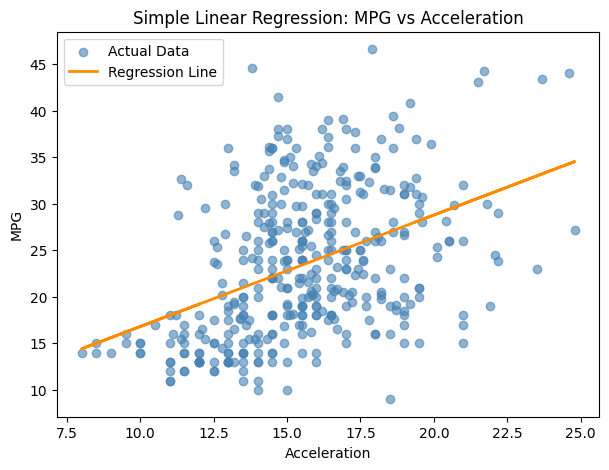

In [ ]:
# Simple linear regression model

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load dataset
df = pd.read_csv("Auto.csv")

# Select 2 numeric attributes
x = df['acceleration'].dropna().values
y = df['mpg'].dropna().values
n = min(len(x), len(y))
x = x[:n]
y = y[:n]

print("First 5 data points:")
print("acceleration:", np.round(x[:5], 3))
print("mpg:", np.round(y[:5], 3))

# Compute means
x_mean = np.mean(x)
y_mean = np.mean(y)
print("\nMean of acceleration:", round(x_mean, 3))
print("Mean of mpg:", round(y_mean, 3))

# Compute slope (β1) and intercept (β0)
numerator = np.sum((x - x_mean) * (y - y_mean))
denominator = np.sum((x - x_mean)**2)
beta1 = numerator / denominator
beta0 = y_mean - beta1 * x_mean

print("\nSlope (β1):", round(beta1, 4))
print("Intercept (β0):", round(beta0, 4))
print(f"\nRegression Equation: mpg = {beta0:.4f} + {beta1:.4f} * acceleration")

# Predict y values
y_pred = beta0 + beta1 * x

# Compute R² value
ss_total = np.sum((y - y_mean)**2)
ss_residual = np.sum((y - y_pred)**2)
r2 = 1 - (ss_residual / ss_total)
print("\nR-squared:", round(r2, 4))

# Plot regression
plt.figure(figsize=(7,5))
plt.scatter(x, y, color='steelblue', label='Actual Data', alpha=0.6)
plt.plot(x, y_pred, color='darkorange', linewidth=2, label='Regression Line')
plt.xlabel("Acceleration")
plt.ylabel("MPG")
plt.title("Simple Linear Regression: MPG vs Acceleration")
plt.legend()
plt.show()


In [ ]:
# Simple Linear Regression for prediction

import pandas as pd
import numpy as np

# Load dataset
df = pd.read_csv("Auto.csv")

# Select variables
x = df['acceleration'].dropna().values
y = df['mpg'].dropna().values

# Ensure equal length
n = min(len(x), len(y))
x = x[:n]
y = y[:n]

# Compute slope and intercept
x_mean = np.mean(x)
y_mean = np.mean(y)
beta1 = np.sum((x - x_mean)*(y - y_mean)) / np.sum((x - x_mean)**2)
beta0 = y_mean - beta1 * x_mean

# Predict mpg values
y_pred = beta0 + beta1 * x

# Display regression equation
print(f"Regression Equation: mpg = {beta0:.4f} + {beta1:.4f} * acceleration\n")

# First 10 predictions
print("First 10 predictions:")
for i in range(10):
    print(f"Actual MPG: {y[i]:.2f} | Predicted MPG: {y_pred[i]:.2f}")


Regression Equation: mpg = 4.8332 + 1.1976 * acceleration

First 10 predictions:
Actual MPG: 18.00 | Predicted MPG: 19.20
Actual MPG: 15.00 | Predicted MPG: 18.61
Actual MPG: 18.00 | Predicted MPG: 18.01
Actual MPG: 16.00 | Predicted MPG: 19.20
Actual MPG: 17.00 | Predicted MPG: 17.41
Actual MPG: 15.00 | Predicted MPG: 16.81
Actual MPG: 14.00 | Predicted MPG: 15.61
Actual MPG: 14.00 | Predicted MPG: 15.01
Actual MPG: 14.00 | Predicted MPG: 16.81
Actual MPG: 15.00 | Predicted MPG: 15.01


In [ ]:
# Model evaluation

import pandas as pd
import numpy as np

# Load dataset
df = pd.read_csv("Auto.csv")

# Select attributes
x = df['acceleration'].dropna().values
y = df['mpg'].dropna().values

# Ensure equal length
n = min(len(x), len(y))
x = x[:n]
y = y[:n]

# Compute slope & intercept
x_mean = np.mean(x)
y_mean = np.mean(y)
beta1 = np.sum((x - x_mean)*(y - y_mean)) / np.sum((x - x_mean)**2)
beta0 = y_mean - beta1 * x_mean

# Predict mpg
y_pred = beta0 + beta1 * x

# Error metrics
r2 = 1 - np.sum((y - y_pred)**2) / np.sum((y - y_mean)**2)
mse = np.mean((y - y_pred)**2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y - y_pred))

# Display results
print(f"R²: {r2:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")


R²: 0.1792
MSE: 49.8736
RMSE: 7.0621
MAE: 5.7951


In [ ]:
# Confusion matrix

import pandas as pd
import numpy as np

# Load dataset
df = pd.read_csv("Auto.csv")

# Select attributes
x = df['acceleration'].dropna().values
y = df['mpg'].dropna().values

n = min(len(x), len(y))
x = x[:n]
y = y[:n]

# Compute regression coefficients
x_mean = np.mean(x)
y_mean = np.mean(y)
beta1 = np.sum((x - x_mean)*(y - y_mean)) / np.sum((x - x_mean)**2)
beta0 = y_mean - beta1 * x_mean

# Predictions
y_pred = beta0 + beta1 * x

# Convert to binary classification
threshold = np.mean(y)
y_true_class = (y >= threshold).astype(int)
y_pred_class = (y_pred >= threshold).astype(int)

# Confusion matrix components
TP = np.sum((y_true_class == 1) & (y_pred_class == 1))
TN = np.sum((y_true_class == 0) & (y_pred_class == 0))
FP = np.sum((y_true_class == 0) & (y_pred_class == 1))
FN = np.sum((y_true_class == 1) & (y_pred_class == 0))

# Metrics
accuracy = (TP + TN) / (TP + TN + FP + FN)
error_rate = 1 - accuracy
precision = TP / (TP + FP) if (TP + FP) != 0 else 0
recall = TP / (TP + FN) if (TP + FN) != 0 else 0
specificity = TN / (TN + FP) if (TN + FP) != 0 else 0
f1 = (2 * precision * recall) / (precision + recall) if (precision + recall) != 0 else 0

# Display confusion matrix and results
print("Confusion Matrix:")
print(f"TP = {TP}, FP = {FP}")
print(f"FN = {FN}, TN = {TN}\n")

print(f"Accuracy: {accuracy:.4f}")
print(f"Error Rate: {error_rate:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")


Confusion Matrix:
TP = 106, FP = 73
FN = 80, TN = 133

Accuracy: 0.6097
Error Rate: 0.3903
Precision: 0.5922
Recall: 0.5699
F1 Score: 0.5808
Specificity: 0.6456
